In [1]:
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel
import seaborn as sb

In [2]:
try:
    os.makedirs('saved_plots')
except:
    pass
try:
    os.makedirs('saved_plots_biobj')
except:
    pass

In [3]:
def median_score_single(pred, color=None, label=None, **kwargs):
    pred_list = list(pred.to_numpy())
    medians = np.array([np.median(y) for y in pred_list])
    q25 = np.array([np.percentile(y, 25) for y in pred_list])
    q75 = np.array([np.percentile(y, 75) for y in pred_list])
    plt.plot(medians, c=color, label=label, **kwargs)
    label = None  # avoid multiple legend entries
    plt.fill_between(
        np.arange(medians.shape[0]), q25, q75, alpha=.1, color=color)
    return medians

In [4]:
def plot_aucs(List_chemical_space,title,return_df=False,dir_save='saved_plots'):
    list_all_aucs = []
    for chemical_space in List_chemical_space:
        list_all_aucs.extend(auc_dict[chemical_space]['lr'])
    for chemical_space in List_chemical_space:
        list_all_aucs.extend(auc_dict[chemical_space]['rf'])

    auc_df = pd.DataFrame(list_all_aucs,columns=['AUC'])
    models_df = pd.DataFrame(['LR' for k in list(range(15*len(List_chemical_space)))]+
                             ['RF' for k in list(range(15*len(List_chemical_space)))],columns=['Model'])
    oracles_df = pd.DataFrame(list(range(15*len(List_chemical_space)))+list(range(15*len(List_chemical_space))),columns=['oracle'])
    df_auc = pd.concat([auc_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="AUC", data=df_auc, hue="oracle")
    sb.boxplot(x="Model", y="AUC", data=df_auc, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    p_value = ttest_rel(df_auc['AUC'][df_auc['Model']=='LR'],df_auc['AUC'][df_auc['Model']=='RF'])[1] 
    if np.log10(p_value)<=-2:
        plt.title('AUC of Models - '+title+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('AUC of Models - '+title+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig(dir_save+'/boxplot_auc_'+model_type+'_'+title+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()
    if return_df:
        return df_auc

# Mono-objective, power 6

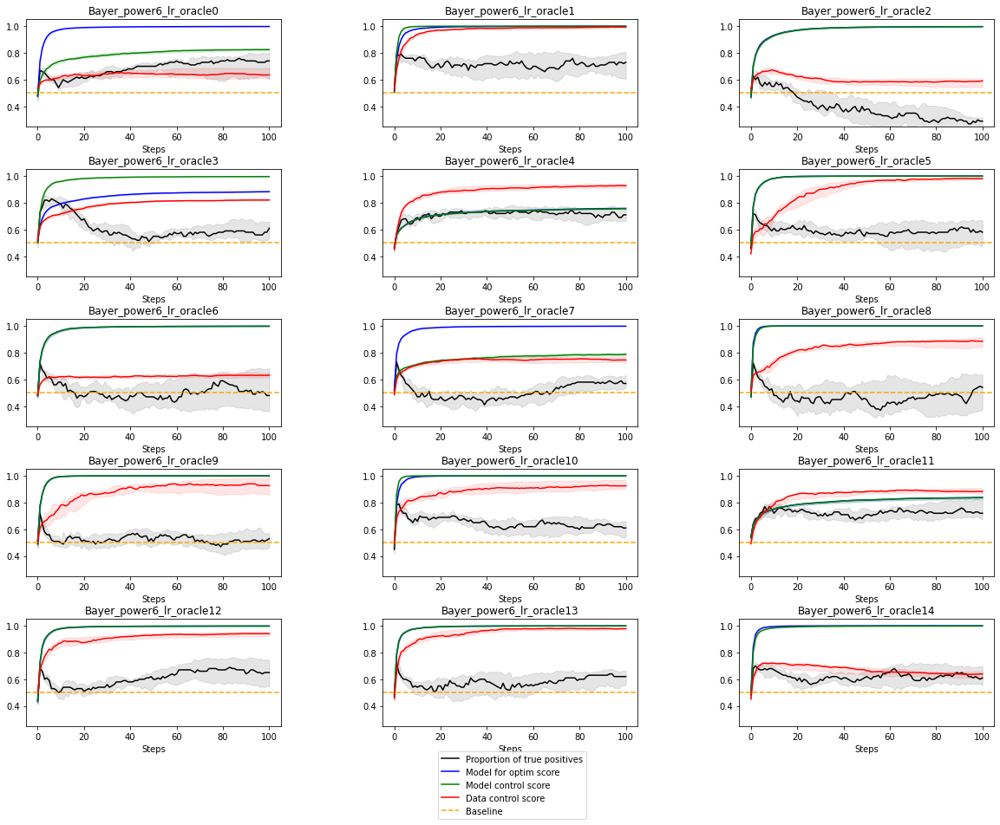

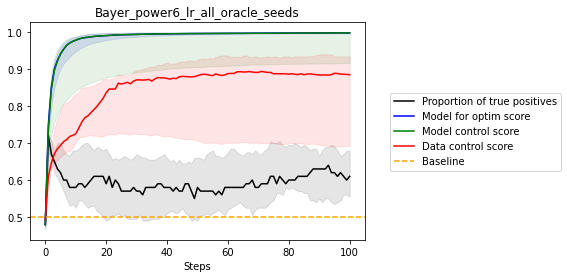

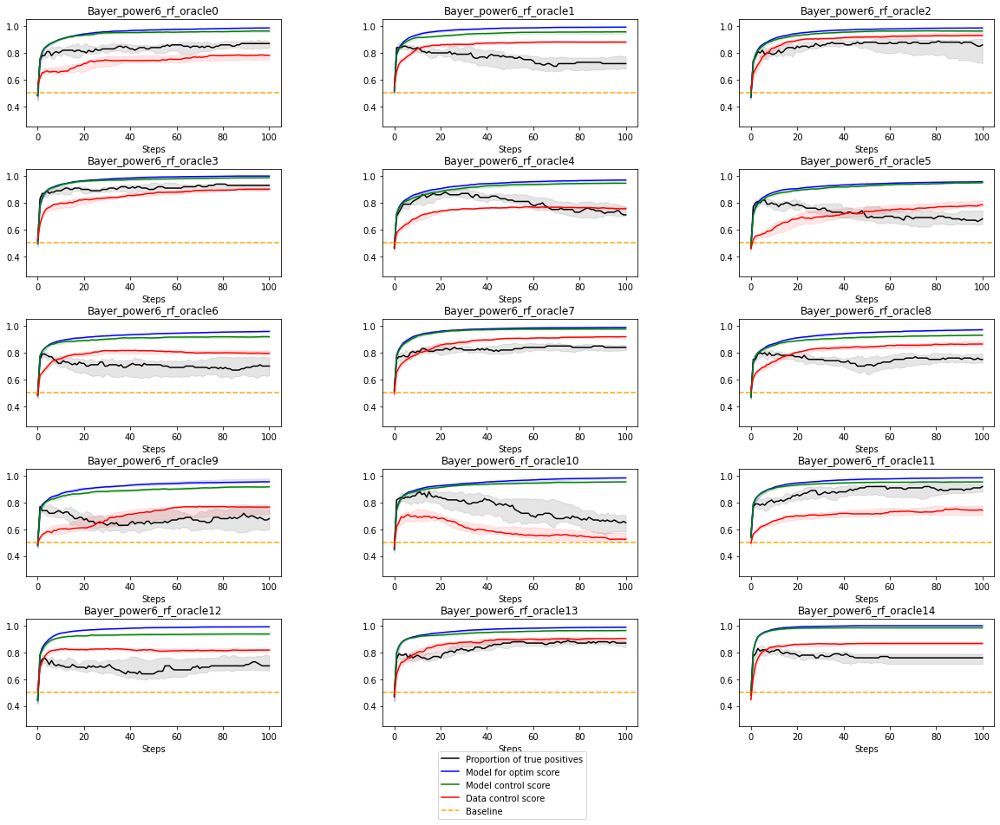

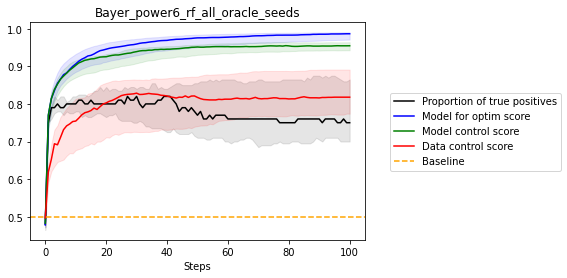

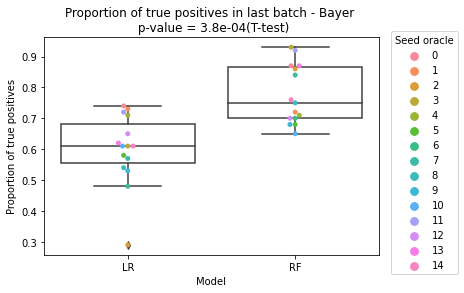

...

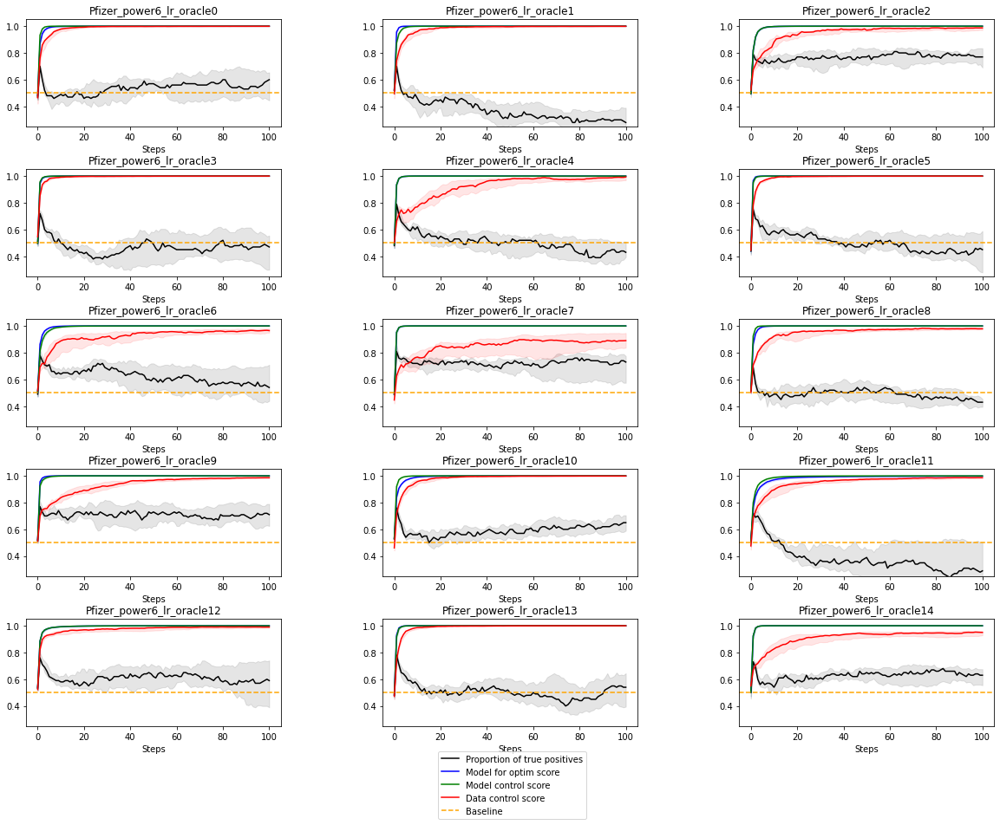

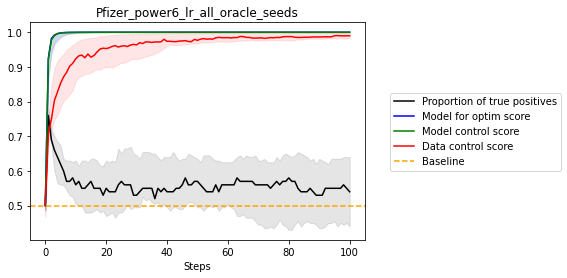

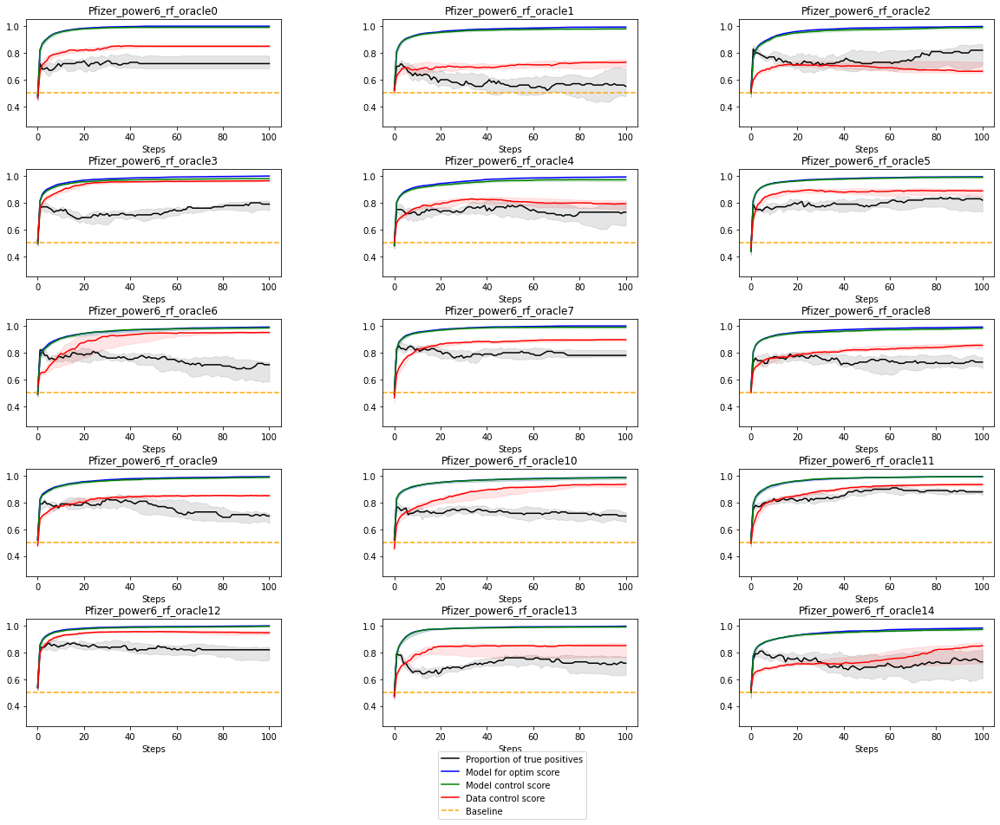

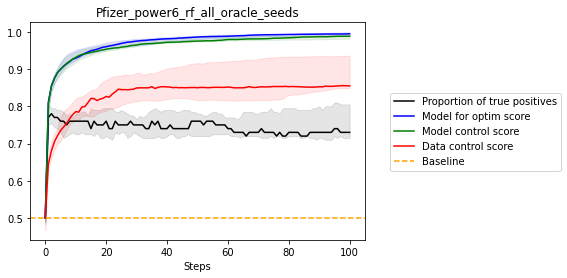

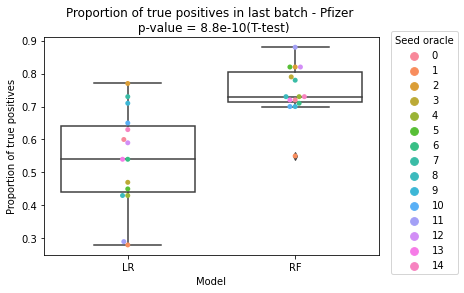

In [5]:
# monoobjective, power 6
power = 6
nb_steps = 100
directory_results = 'my_res_dir'
num_targets=1
num_seeds_oracle = 15

dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_med_model_control = dict()
dico_med_data_control = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_med_model_control['rf'],dico_med_model_control['lr']=[],[]
dico_med_data_control['rf'],dico_med_data_control['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(0,num_seeds_oracle):
            target0 = 'target_'+str(num_targets)+'targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)

            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))

                    L_real = []
                    for idx in range(nb_steps+1):
                        L_real.append(np.mean(np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])))
                    dico_results[seed_ga] = L_real

                    L_model_for_optim = []
                    for idx in range(nb_steps+1):
                        L_model_for_optim.append(np.mean(results_one['model_for_optim'][idx][target0]))
                    dico_model_for_optim[seed_ga]=L_model_for_optim

                    L_model_control = []
                    for idx in range(nb_steps+1):
                        L_model_control.append(np.mean(results_one['model_control'][idx][target0]))
                    dico_model_control[seed_ga]=L_model_control

                    L_data_control = []
                    for idx in range(nb_steps+1):
                        L_data_control.append(np.mean(results_one['data_control'][idx][target0]))
                    dico_data_control[seed_ga]=L_data_control

            df_all = pd.DataFrame(dico_results)
            dico_med_all[model_type]
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)
            df_model_control = pd.DataFrame(dico_model_control)
            df_data_control = pd.DataFrame(dico_data_control)

            ax = fig.add_subplot(5, 3, seed_oracle+1)
            yticks = np.arange(0.4, 1+0.01, 0.2)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=0.25,top=1.05)
            med_all = median_score_single(df_all,label='Proportion of true positives',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
            med_model_control = median_score_single(df_model_control,label='Model control score',color='green')
            med_data_control = median_score_single(df_data_control,label='Data control score',color='red')
            plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)
            l_med_model_control.append(med_model_control)
            l_med_data_control.append(med_data_control)
            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(median_real.iloc[-1])
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(median_real.iloc[-1])
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots/grid_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)
        dico_med_model_control[model_type].extend(l_med_model_control)
        dico_med_data_control[model_type].extend(l_med_data_control)
        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T
        df_model_control = pd.DataFrame(l_med_model_control).T
        df_data_control = pd.DataFrame(l_med_data_control).T
        median_score_single(df_all,label='Proportion of true positives',color='black')
        median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
        median_score_single(df_model_control,label='Model control score',color='green')
        median_score_single(df_data_control,label='Data control score',color='red')
        plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.6,0.7])
        plt.savefig('saved_plots/average_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Proportion of true positives'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    
    
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    if np.log10(p_value)<=-2:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots/boxplot_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()

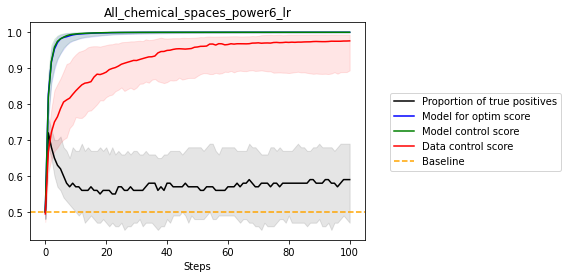

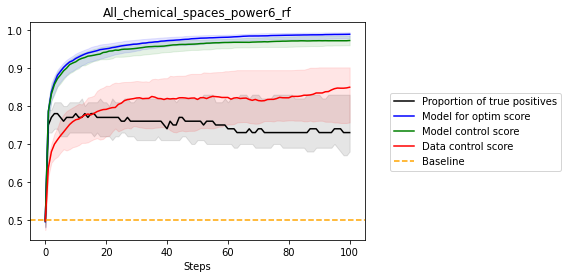

In [6]:
for model_type in ['lr','rf']:
    df_all = pd.DataFrame(dico_med_all[model_type]).T
    df_med_model_control = pd.DataFrame(dico_med_model_control[model_type]).T
    df_med_data_control = pd.DataFrame(dico_med_data_control[model_type]).T
    df_med_model_for_optim = pd.DataFrame(dico_med_model_for_optim[model_type]).T
    median_score_single(df_all,label='Proportion of true positives',color='black')
    median_score_single(df_med_model_for_optim,label='Model for optim score',color='blue')
    median_score_single(df_med_model_control,label='Model control score',color='green')
    median_score_single(df_med_data_control,label='Data control score',color='red')
    plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
    plt.xlabel('Steps')
    plt.title('All_chemical_spaces_power'+str(power)+'_'+model_type)
    plt.legend(bbox_to_anchor=[1.6,0.7])
    plt.savefig('saved_plots/average_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
    plt.show()

In [7]:
print(np.argmax(pd.DataFrame(dico_med_all['lr']).median(0)))
print(np.argmax(pd.DataFrame(dico_med_all['rf']).median(0)))

1
3


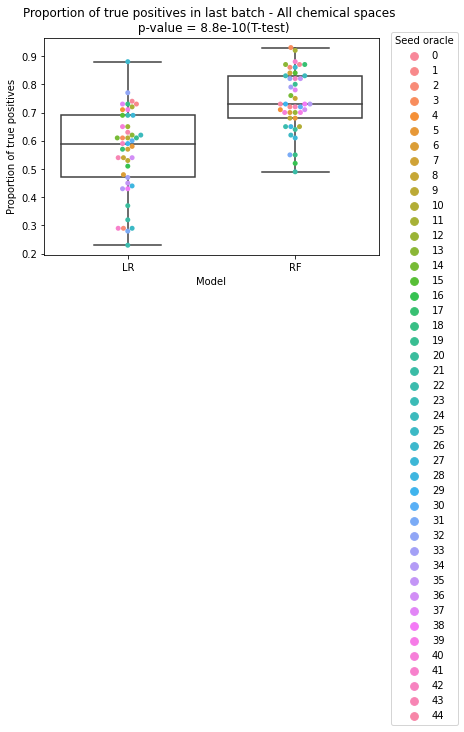

In [8]:
res_df = pd.DataFrame(dico_last_batch['lr']+dico_last_batch['rf'],columns=['Proportion of true positives'])
models_df = pd.DataFrame(['LR' for k in range(45)]+['RF' for k in range(45)],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_res = pd.concat([res_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots/boxplot_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [9]:
auc_dict = dict()
for chemical_space in ['bayer','merck','pfizer']:
    auc_dict[chemical_space] = dict()
    for model_type in ['lr','rf']:
        auc_dict[chemical_space][model_type] = []
        for seed_oracle in range(15):
            metrics = json.load(open(f'MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{seed_oracle}_targid0/{model_type}/model_for_optim_metrics.json', 'r'))
            auc = metrics['auc']
            auc_dict[chemical_space][model_type].append(auc)

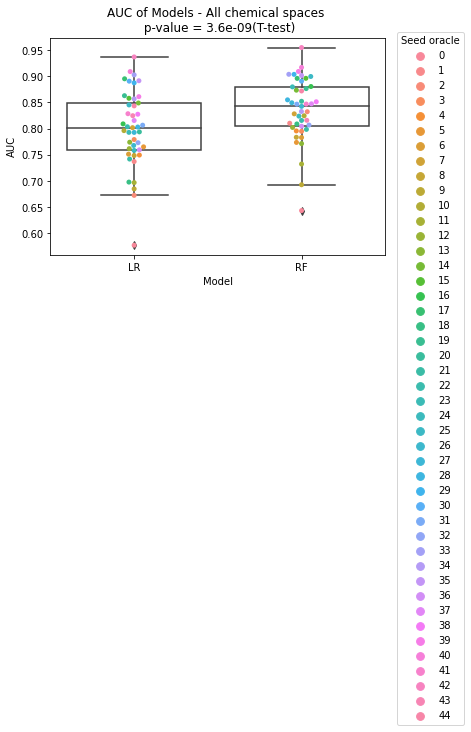

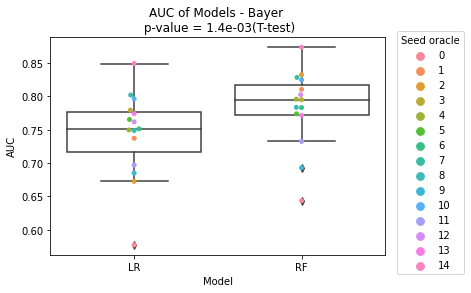

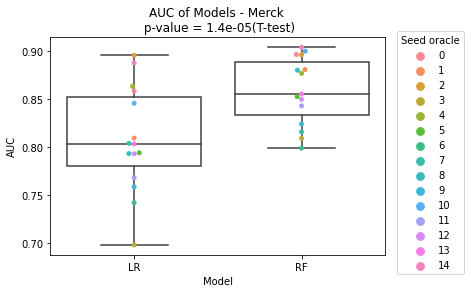

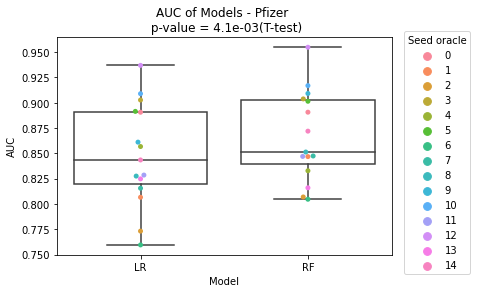

In [10]:
df_auc = plot_aucs(['bayer','merck','pfizer'],'All chemical spaces',return_df=True)
plot_aucs(['bayer'],'Bayer')
plot_aucs(['merck'],'Merck')
plot_aucs(['pfizer'],'Pfizer')

In [11]:
oracles_adjusted = df_auc[df_auc['Model']=='LR'][
    (df_auc[df_auc['Model']=='LR']['AUC']-df_auc[df_auc['Model']=='RF']['AUC'].reset_index(drop=True)>-0.015)]
len(oracles_adjusted)

12

In [12]:
df_auc_adjusted = df_auc[df_auc['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

In [13]:
list_all_aucs = []
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['lr'])
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['rf'])

auc_df = pd.DataFrame(list_all_aucs,columns=['AUC'])
models_df = pd.DataFrame(['LR' for k in list(range(45))]+
                         ['RF' for k in list(range(45))],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_auc = pd.concat([auc_df,models_df,oracles_df],1)

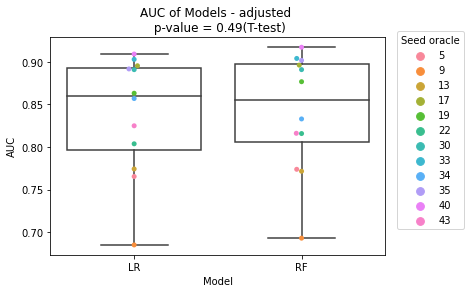

In [14]:
ax = sb.swarmplot(x="Model", y="AUC", data=df_auc_adjusted, hue="oracle")
sb.boxplot(x="Model", y="AUC", data=df_auc_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='LR'],df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='RF'])[1]
if np.log10(p_value)<=-2:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.1e'  % 
               p_value+'(T-test)')
else:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.2f'  % 
           p_value+'(T-test)')
plt.savefig('saved_plots/boxplot_auc_'+model_type+'_'+'adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [15]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

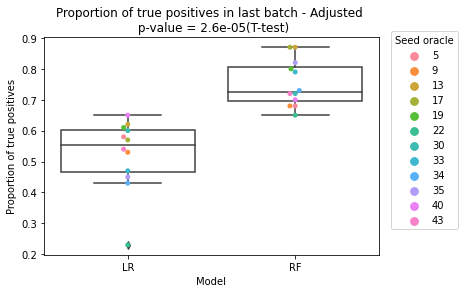

In [16]:
ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Proportion of true positives'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Proportion of true positives'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots/boxplot_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

# Monoobjective power 15

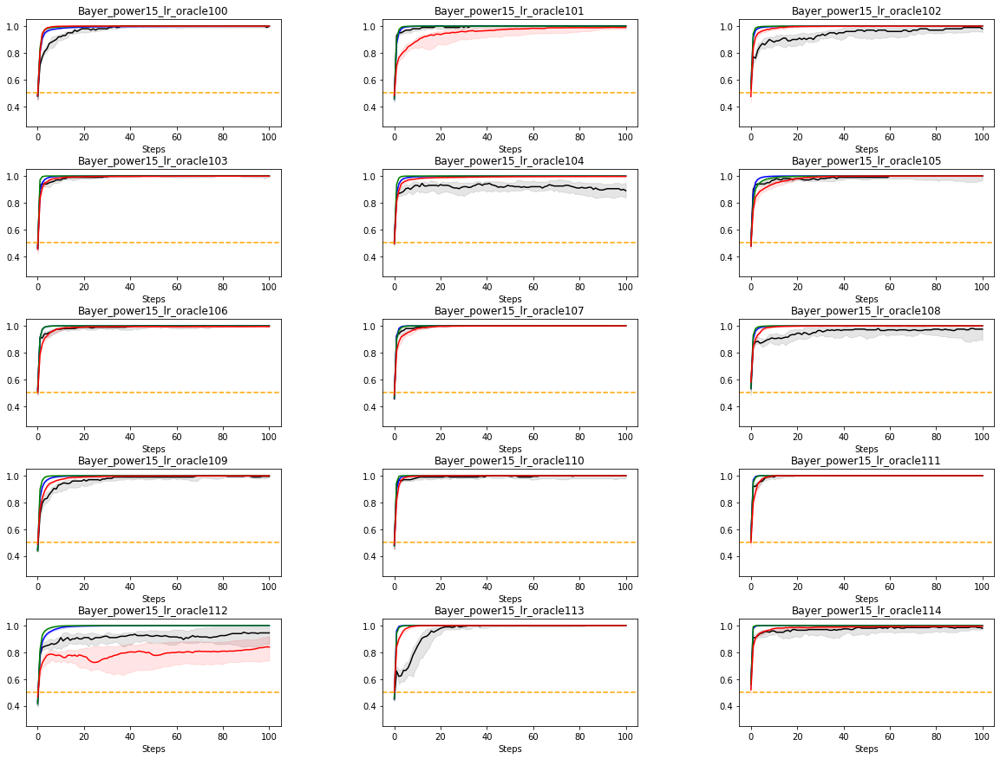

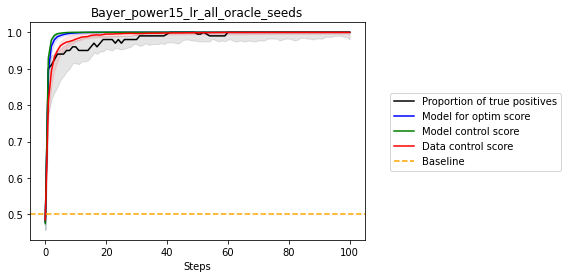

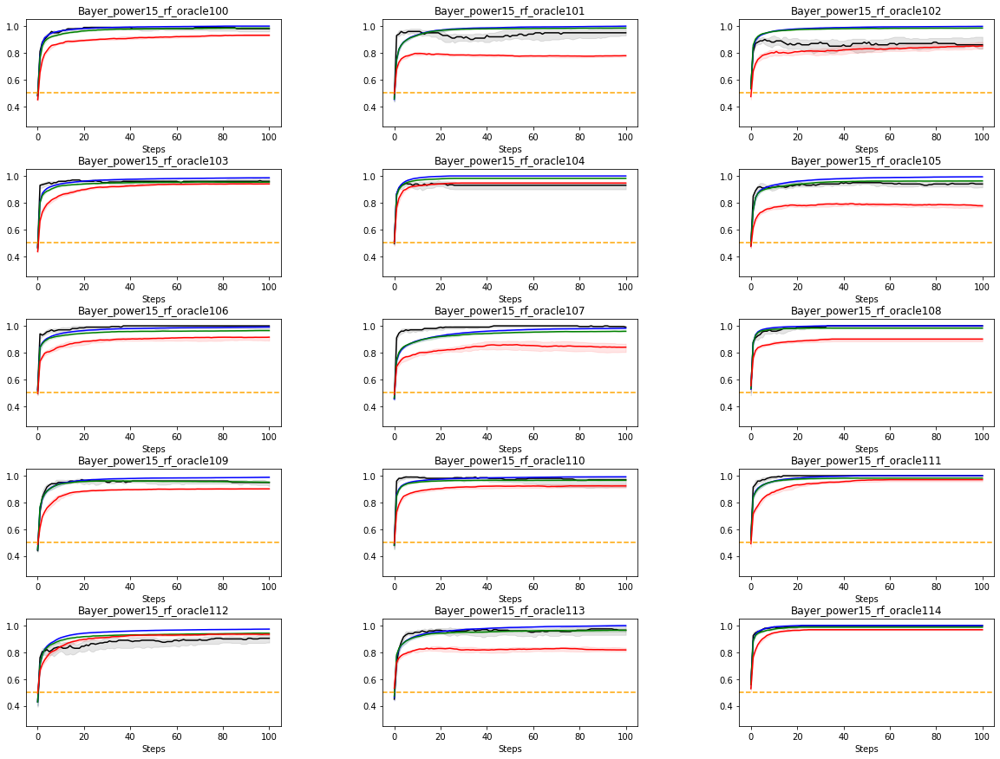

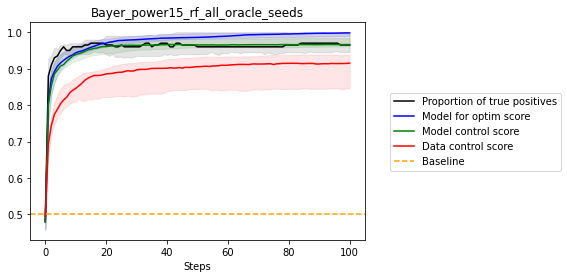

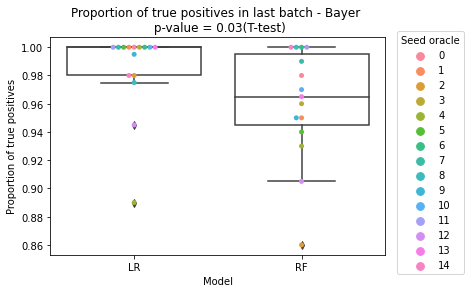

...

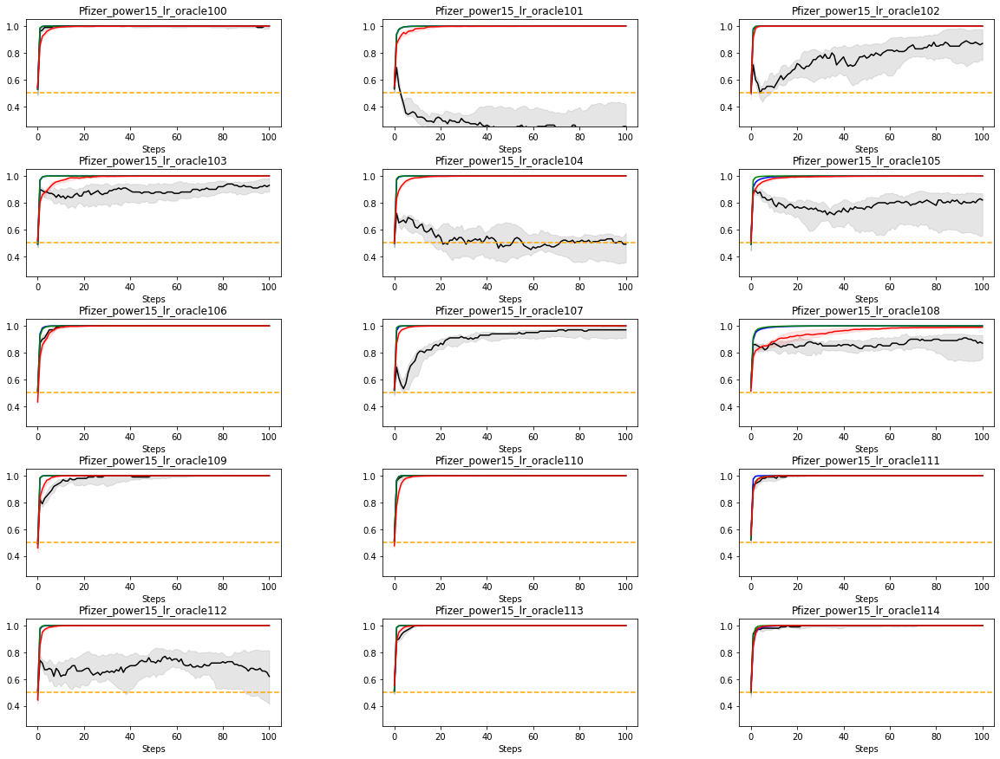

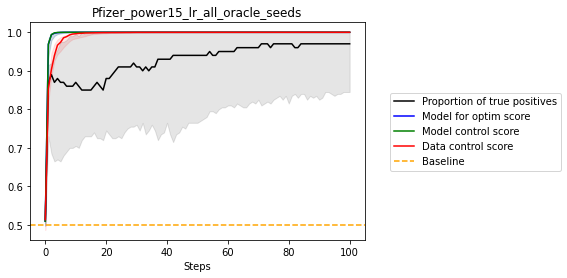

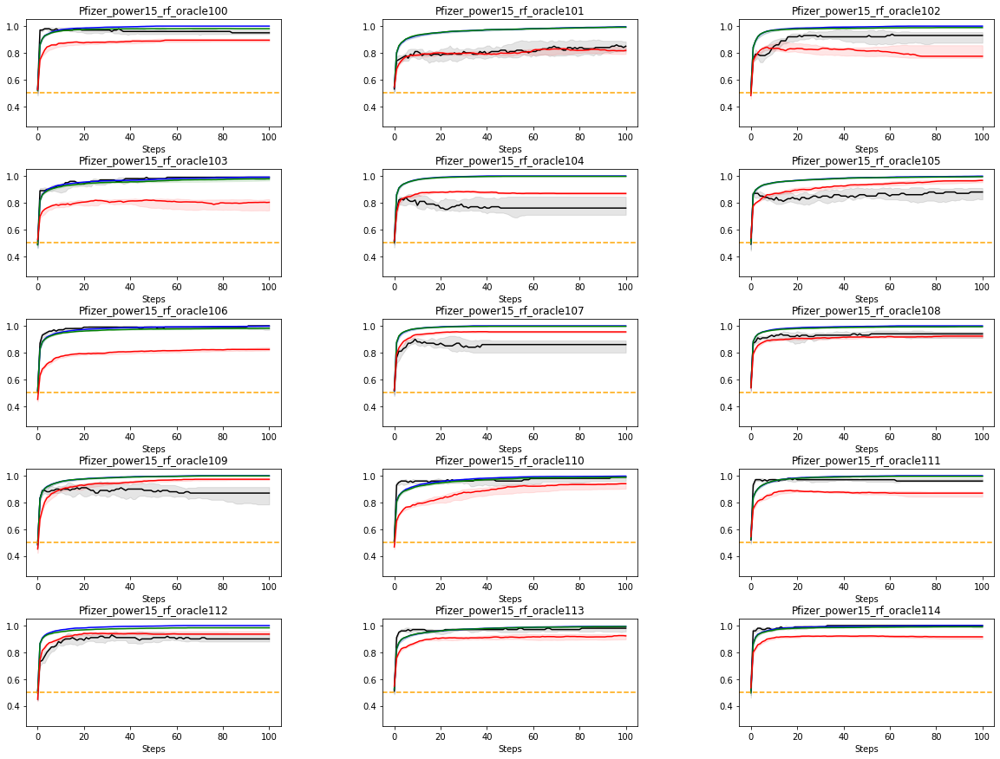

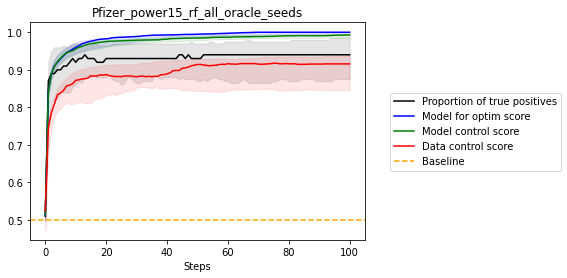

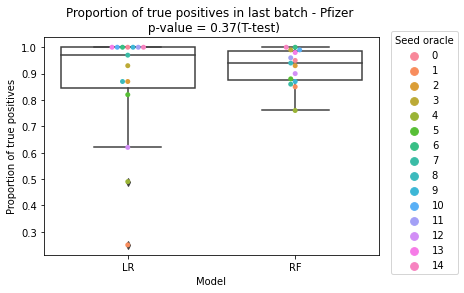

In [17]:
power = 15
nb_steps = 100
directory_results = 'my_res_dir'
num_targets=1
num_seeds_oracle = 15

dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_med_model_control = dict()
dico_med_data_control = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_med_model_control['rf'],dico_med_model_control['lr']=[],[]
dico_med_data_control['rf'],dico_med_data_control['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(100,100+num_seeds_oracle):
            target0 = 'target_'+str(num_targets)+'targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)

            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    try:
                        results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))

                        L_real = []
                        for idx in range(nb_steps+1):
                            L_real.append(np.mean(np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])))
                        dico_results[seed_ga] = L_real

                        L_model_for_optim = []
                        for idx in range(nb_steps+1):
                            L_model_for_optim.append(np.mean(results_one['model_for_optim'][idx][target0]))
                        dico_model_for_optim[seed_ga]=L_model_for_optim

                        L_model_control = []
                        for idx in range(nb_steps+1):
                            L_model_control.append(np.mean(results_one['model_control'][idx][target0]))
                        dico_model_control[seed_ga]=L_model_control

                        L_data_control = []
                        for idx in range(nb_steps+1):
                            L_data_control.append(np.mean(results_one['data_control'][idx][target0]))
                        dico_data_control[seed_ga]=L_data_control
                    except:
                        0

            df_all = pd.DataFrame(dico_results)
            dico_med_all[model_type]
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)
            df_model_control = pd.DataFrame(dico_model_control)
            df_data_control = pd.DataFrame(dico_data_control)

            ax = fig.add_subplot(5, 3, seed_oracle+1-100)
            yticks = np.arange(0.4, 1+0.01, 0.2)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=0.25,top=1.05)
            med_all = median_score_single(df_all,label='Proportion of true positives',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
            med_model_control = median_score_single(df_model_control,label='Model control score',color='green')
            med_data_control = median_score_single(df_data_control,label='Data control score',color='red')
            plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)
            l_med_model_control.append(med_model_control)
            l_med_data_control.append(med_data_control)
            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(median_real.iloc[-1])
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(median_real.iloc[-1])
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots/grid_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)
        dico_med_model_control[model_type].extend(l_med_model_control)
        dico_med_data_control[model_type].extend(l_med_data_control)
        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T
        df_model_control = pd.DataFrame(l_med_model_control).T
        df_data_control = pd.DataFrame(l_med_data_control).T
        median_score_single(df_all,label='Proportion of true positives',color='black')
        median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
        median_score_single(df_model_control,label='Model control score',color='green')
        median_score_single(df_data_control,label='Data control score',color='red')
        plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.6,0.7])
        plt.savefig('saved_plots/average_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Proportion of true positives'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    if np.log10(p_value)<=-2:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots/boxplot_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()

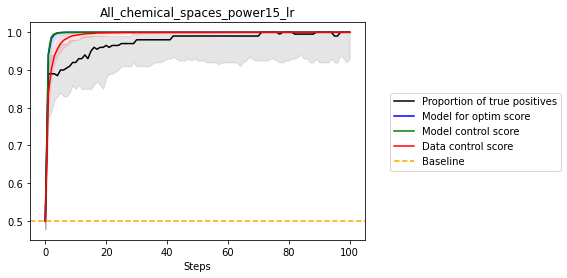

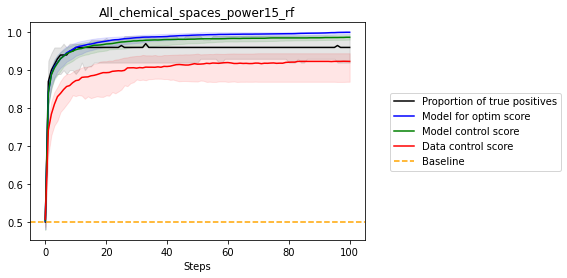

In [18]:
for model_type in ['lr','rf']:
    df_all = pd.DataFrame(dico_med_all[model_type]).T
    df_med_model_control = pd.DataFrame(dico_med_model_control[model_type]).T
    df_med_data_control = pd.DataFrame(dico_med_data_control[model_type]).T
    df_med_model_for_optim = pd.DataFrame(dico_med_model_for_optim[model_type]).T
    median_score_single(df_all,label='Proportion of true positives',color='black')
    median_score_single(df_med_model_for_optim,label='Model for optim score',color='blue')
    median_score_single(df_med_model_control,label='Model control score',color='green')
    median_score_single(df_med_data_control,label='Data control score',color='red')
    plt.axhline(y=0.5, color='orange', linestyle='--',label='Baseline')
    plt.xlabel('Steps')
    plt.title('All_chemical_spaces_power'+str(power)+'_'+model_type)
    plt.legend(bbox_to_anchor=[1.6,0.7])
    plt.savefig('saved_plots/average_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
    plt.show()

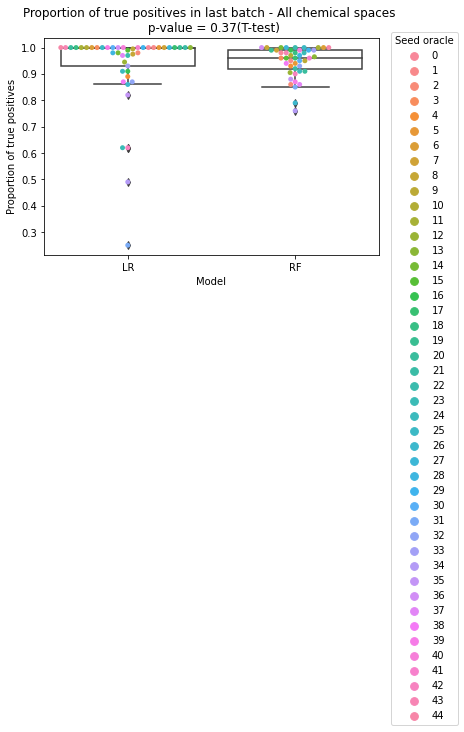

In [19]:
res_df = pd.DataFrame(dico_last_batch['lr']+dico_last_batch['rf'],columns=['Proportion of true positives'])
models_df = pd.DataFrame(['LR' for k in range(45)]+['RF' for k in range(45)],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_res = pd.concat([res_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots/boxplot_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [20]:
auc_dict = dict()
for chemical_space in ['bayer','merck','pfizer']:
    auc_dict[chemical_space] = dict()
    for model_type in ['lr','rf']:
        auc_dict[chemical_space][model_type] = []
        for seed_oracle in range(15):
            metrics = json.load(open(f'MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{100+seed_oracle}_targid0/{model_type}/model_for_optim_metrics.json', 'r'))
            auc = metrics['auc']
            auc_dict[chemical_space][model_type].append(auc)

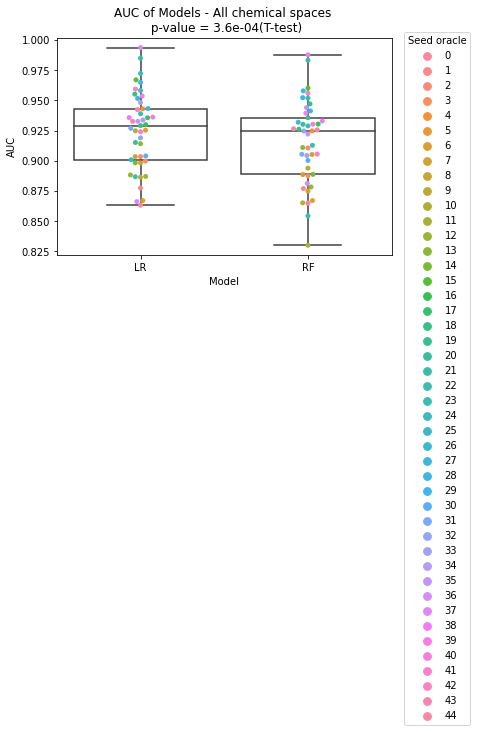

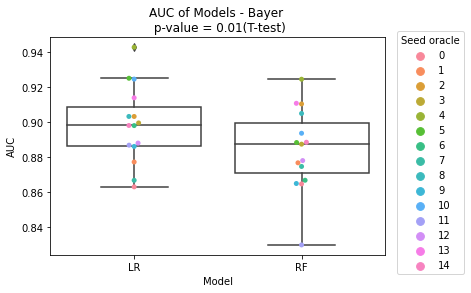

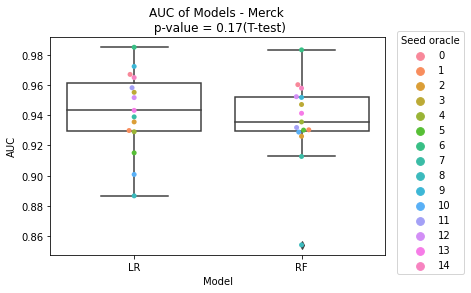

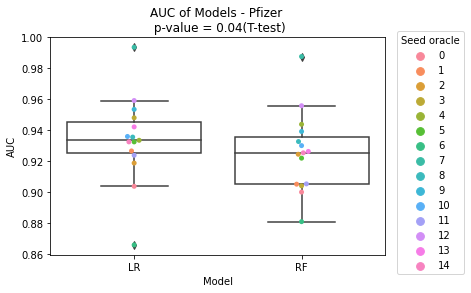

In [21]:
df_auc = plot_aucs(['bayer','merck','pfizer'],'All chemical spaces',return_df=True)
plot_aucs(['bayer'],'Bayer')
plot_aucs(['merck'],'Merck')
plot_aucs(['pfizer'],'Pfizer')

In [22]:
oracles_adjusted = df_auc[df_auc['Model']=='LR'][
    df_auc[df_auc['Model']=='LR']['AUC']-df_auc[df_auc['Model']=='RF']['AUC'].reset_index(drop=True)<0.01]
len(oracles_adjusted)

27

In [23]:
df_auc_adjusted = df_auc[df_auc['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

In [24]:
list_all_aucs = []
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['lr'])
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['rf'])

auc_df = pd.DataFrame(list_all_aucs,columns=['AUC'])
models_df = pd.DataFrame(['LR' for k in list(range(45))]+
                         ['RF' for k in list(range(45))],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_auc = pd.concat([auc_df,models_df,oracles_df],1)

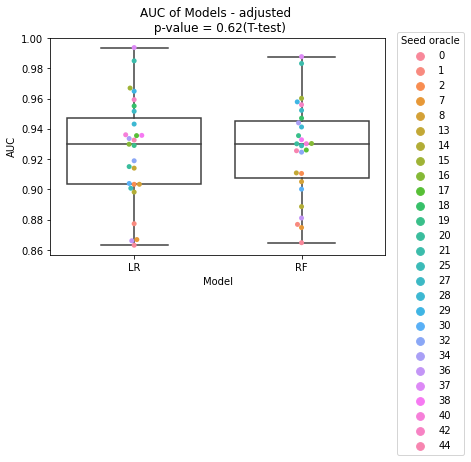

In [25]:
ax = sb.swarmplot(x="Model", y="AUC", data=df_auc_adjusted, hue="oracle")
sb.boxplot(x="Model", y="AUC", data=df_auc_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='LR'],df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='RF'])[1]
if np.log10(p_value)<=-2:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.1e'  % 
               p_value+'(T-test)')
else:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.2f'  % 
           p_value+'(T-test)')

plt.savefig('saved_plots/boxplot_auc_'+model_type+'_'+'adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [26]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

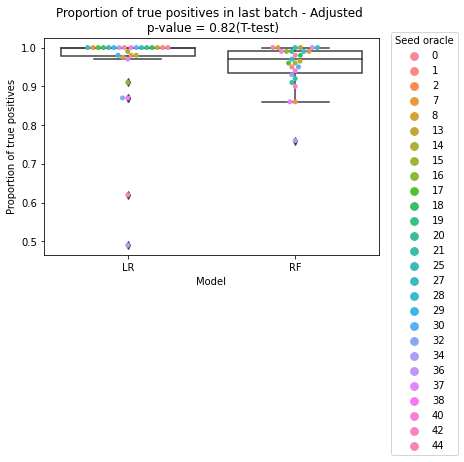

In [27]:
ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Proportion of true positives'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Proportion of true positives'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots/boxplot_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

# Biobjective power 6

In [28]:
# biobjective, power 6
power = 6
nb_steps = 100
directory_results = '../generator-hacking/my_res_dir'
num_targets=2
num_seeds_oracle = 15

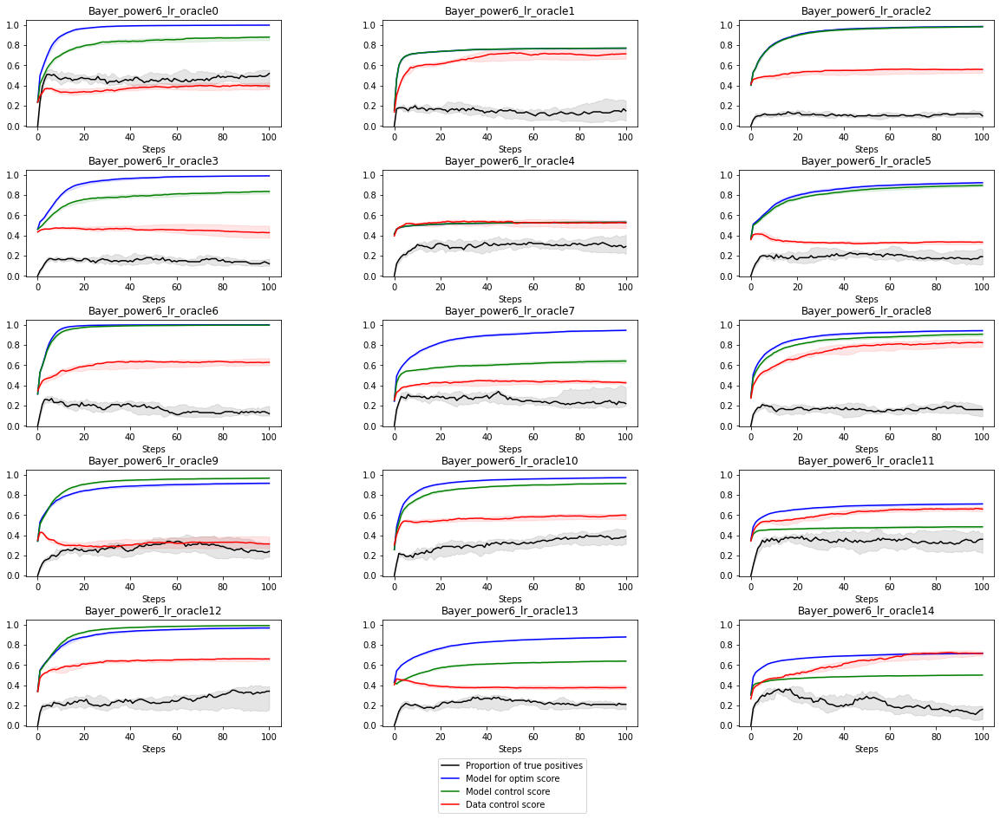

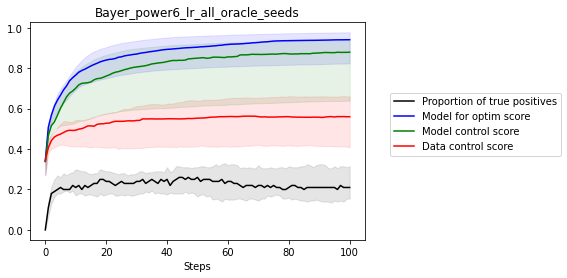

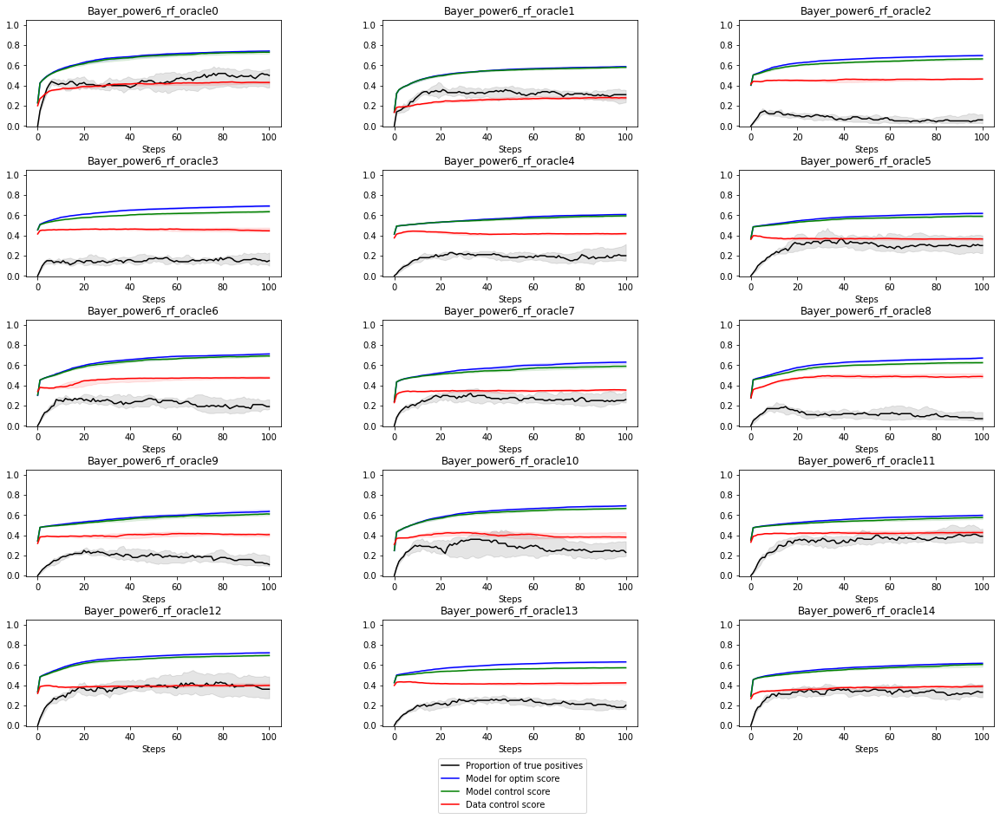

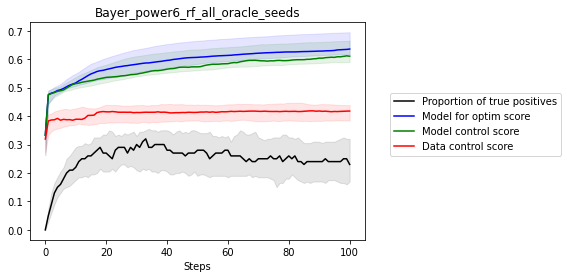

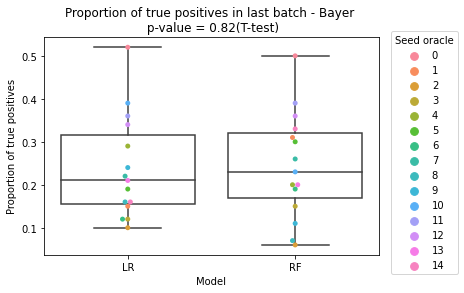

...

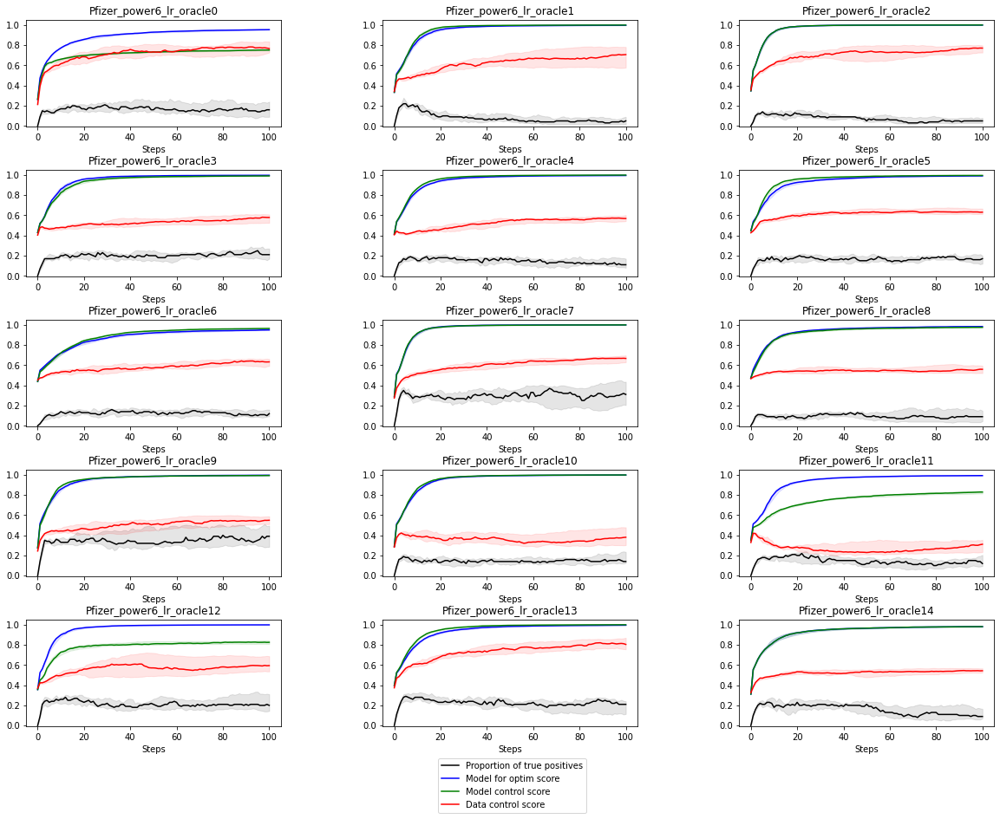

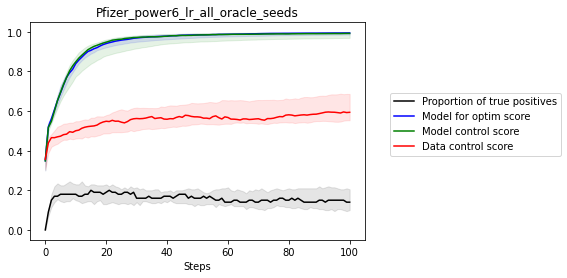

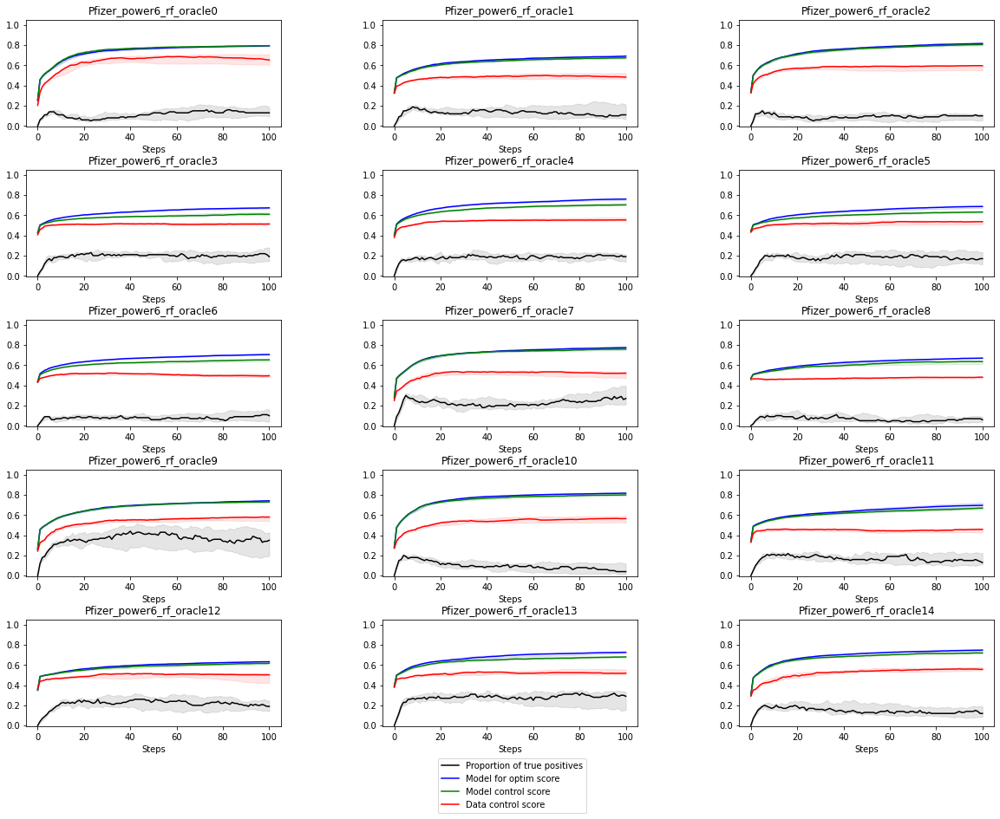

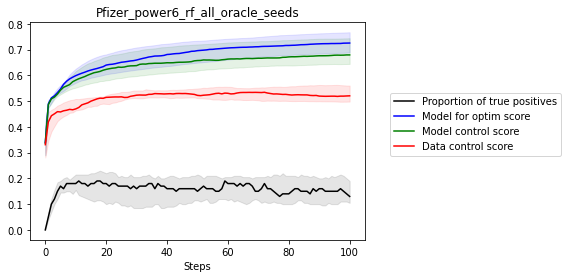

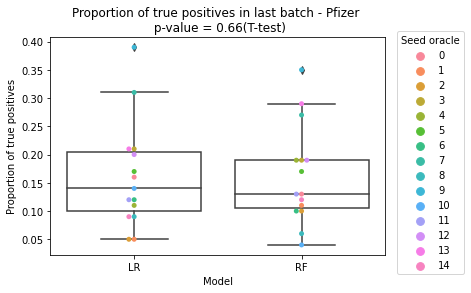

In [29]:
dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_med_model_control = dict()
dico_med_data_control = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_med_model_control['rf'],dico_med_model_control['lr']=[],[]
dico_med_data_control['rf'],dico_med_data_control['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(0,num_seeds_oracle):
            target0 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            target1 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid1'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0+'_SEP_'+target1,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)

            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))
                    
                    L_real = []
                    for idx in range(nb_steps+1):
                        L_real.append(np.mean(np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])\
                                              *np.array(results_one['oracle_binned_'+target1][idx]['oracle_binned_'+target1])))
                    dico_results[seed_ga] = L_real
                    
                    L_model_for_optim = []
                    for idx in range(nb_steps+1):
                        L_model_for_optim.append(np.mean(0.5*np.array(results_one['model_for_optim'][idx][target0])+\
                                                        0.5*np.array(results_one['model_for_optim'][idx][target1])))
                    dico_model_for_optim[seed_ga]=L_model_for_optim

                    L_model_control = []
                    for idx in range(nb_steps+1):
                        L_model_control.append(np.mean(0.5*np.array(results_one['model_control'][idx][target0])+\
                                                        0.5*np.array(results_one['model_control'][idx][target1])))
                    dico_model_control[seed_ga]=L_model_control

                    L_data_control = []
                    for idx in range(nb_steps+1):
                        L_data_control.append(np.mean(0.5*np.array(results_one['data_control'][idx][target0])+\
                                                     0.5*np.array(results_one['data_control'][idx][target1])))
                    dico_data_control[seed_ga]=L_data_control

            df_all = pd.DataFrame(dico_results)
            dico_med_all[model_type]
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)
            df_model_control = pd.DataFrame(dico_model_control)
            df_data_control = pd.DataFrame(dico_data_control)

            ax = fig.add_subplot(5, 3, seed_oracle+1)
            yticks = np.arange(0., 1+0.01, 0.2)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=-0.01,top=1.05)
            med_all = median_score_single(df_all,label='Proportion of true positives',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
            med_model_control = median_score_single(df_model_control,label='Model control score',color='green')
            med_data_control = median_score_single(df_data_control,label='Data control score',color='red')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)
            l_med_model_control.append(med_model_control)
            l_med_data_control.append(med_data_control)
            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(median_real.iloc[-1])
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(median_real.iloc[-1])
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots_biobj/grid_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)
        dico_med_model_control[model_type].extend(l_med_model_control)
        dico_med_data_control[model_type].extend(l_med_data_control)
        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T
        df_model_control = pd.DataFrame(l_med_model_control).T
        df_data_control = pd.DataFrame(l_med_data_control).T
        median_score_single(df_all,label='Proportion of true positives',color='black')
        median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
        median_score_single(df_model_control,label='Model control score',color='green')
        median_score_single(df_data_control,label='Data control score',color='red')
        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.6,0.7])
        plt.savefig('saved_plots_biobj/average_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Proportion of true positives'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    
    
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    if np.log10(p_value)<=-2:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()

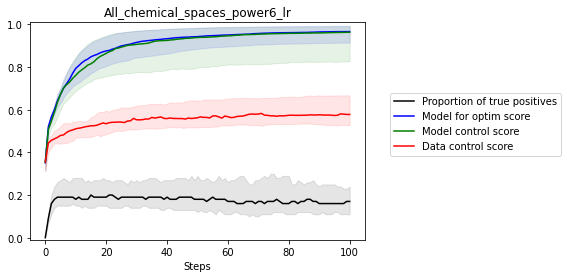

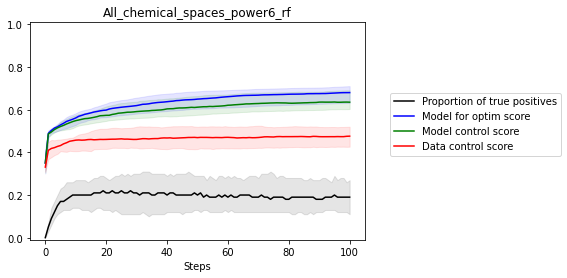

In [30]:
for model_type in ['lr','rf']:
    df_all = pd.DataFrame(dico_med_all[model_type]).T
    df_med_model_control = pd.DataFrame(dico_med_model_control[model_type]).T
    df_med_data_control = pd.DataFrame(dico_med_data_control[model_type]).T
    df_med_model_for_optim = pd.DataFrame(dico_med_model_for_optim[model_type]).T
    median_score_single(df_all,label='Proportion of true positives',color='black')
    median_score_single(df_med_model_for_optim,label='Model for optim score',color='blue')
    median_score_single(df_med_model_control,label='Model control score',color='green')
    median_score_single(df_med_data_control,label='Data control score',color='red')
    plt.xlabel('Steps')
    plt.title('All_chemical_spaces_power'+str(power)+'_'+model_type)
    plt.legend(bbox_to_anchor=[1.6,0.7])
    plt.ylim(-0.01,1.01)
    plt.savefig('saved_plots_biobj/average_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
    plt.show()

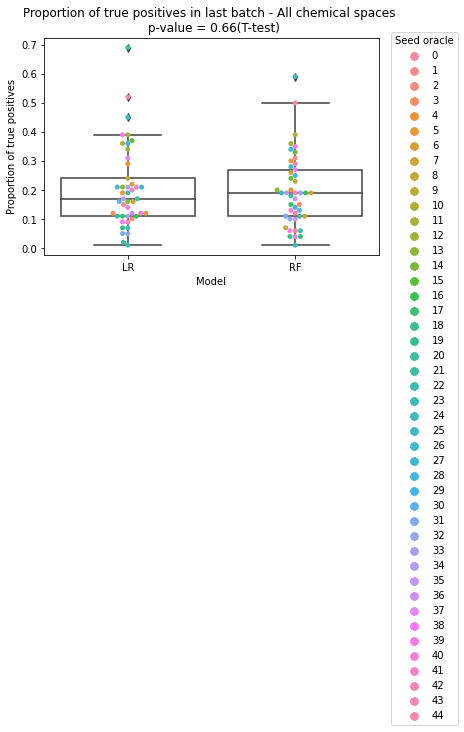

In [31]:
res_df = pd.DataFrame(dico_last_batch['lr']+dico_last_batch['rf'],columns=['Proportion of true positives'])
models_df = pd.DataFrame(['LR' for k in range(45)]+['RF' for k in range(45)],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_res = pd.concat([res_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [32]:
auc_dict = dict()
for chemical_space in ['bayer','merck','pfizer']:
    auc_dict[chemical_space] = dict()
    for model_type in ['lr','rf']:
        auc_dict[chemical_space][model_type] = []
        for seed_oracle in range(15):
            metrics = json.load(open(f'../generator-hacking/MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{seed_oracle}_targid0/{model_type}/model_for_optim_metrics.json', 'r'))
            auc1 = metrics['auc']
            metrics = json.load(open(f'../generator-hacking/MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{seed_oracle}_targid1/{model_type}/model_for_optim_metrics.json', 'r'))
            auc2 = metrics['auc']
            auc_dict[chemical_space][model_type].append(0.5*auc1+0.5*auc2)

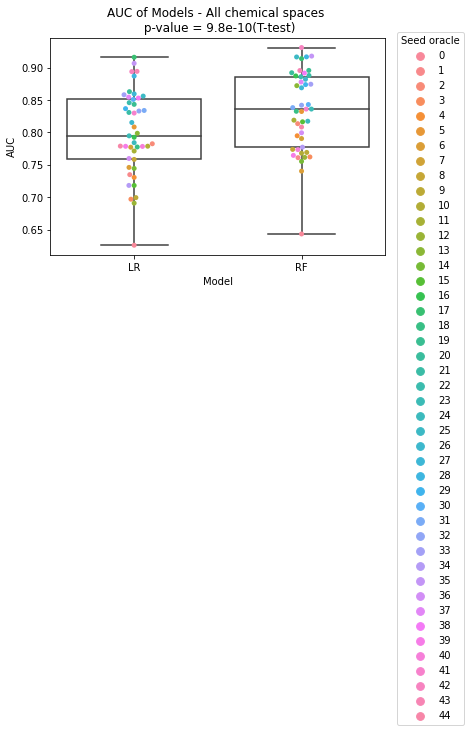

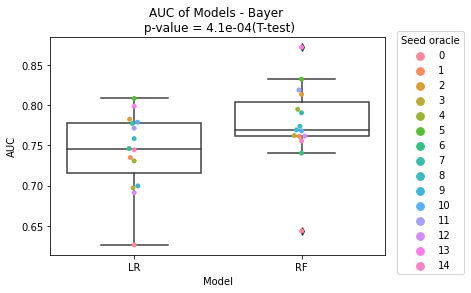

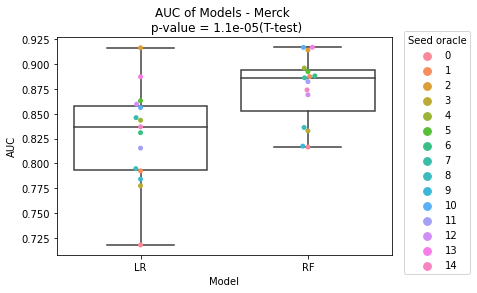

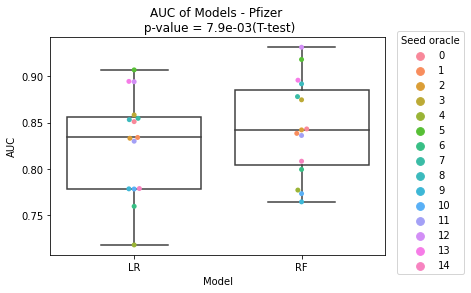

In [33]:
df_auc = plot_aucs(['bayer','merck','pfizer'],'All chemical spaces',return_df=True,dir_save='saved_plots_biobj')
plot_aucs(['bayer'],'Bayer',dir_save='saved_plots_biobj')
plot_aucs(['merck'],'Merck',dir_save='saved_plots_biobj')
plot_aucs(['pfizer'],'Pfizer',dir_save='saved_plots_biobj')

In [34]:
oracles_adjusted = df_auc[df_auc['Model']=='LR'][
    (df_auc[df_auc['Model']=='LR']['AUC']-df_auc[df_auc['Model']=='RF']['AUC'].reset_index(drop=True)>-0.015)]
len(oracles_adjusted)

14

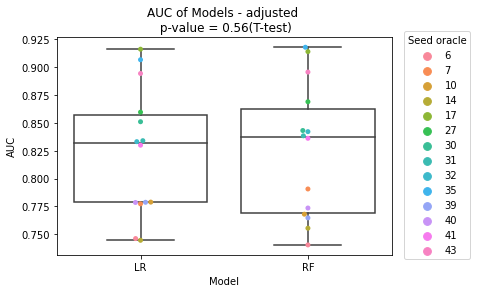

In [35]:
df_auc_adjusted = df_auc[df_auc['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

list_all_aucs = []
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['lr'])
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['rf'])

auc_df = pd.DataFrame(list_all_aucs,columns=['AUC'])
models_df = pd.DataFrame(['LR' for k in list(range(45))]+
                         ['RF' for k in list(range(45))],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_auc = pd.concat([auc_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="AUC", data=df_auc_adjusted, hue="oracle")
sb.boxplot(x="Model", y="AUC", data=df_auc_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='LR'],df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='RF'])[1]
if np.log10(p_value)<=-2:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.1e'  % 
               p_value+'(T-test)')
else:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.2f'  % 
           p_value+'(T-test)')

plt.savefig('saved_plots_biobj/boxplot_auc_'+model_type+'_'+'adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

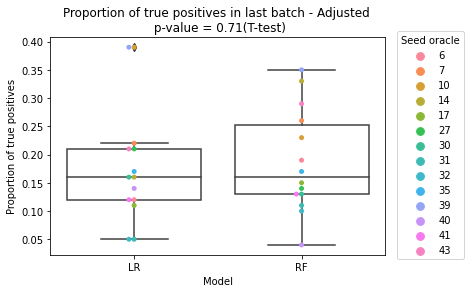

In [36]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Proportion of true positives'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Proportion of true positives'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

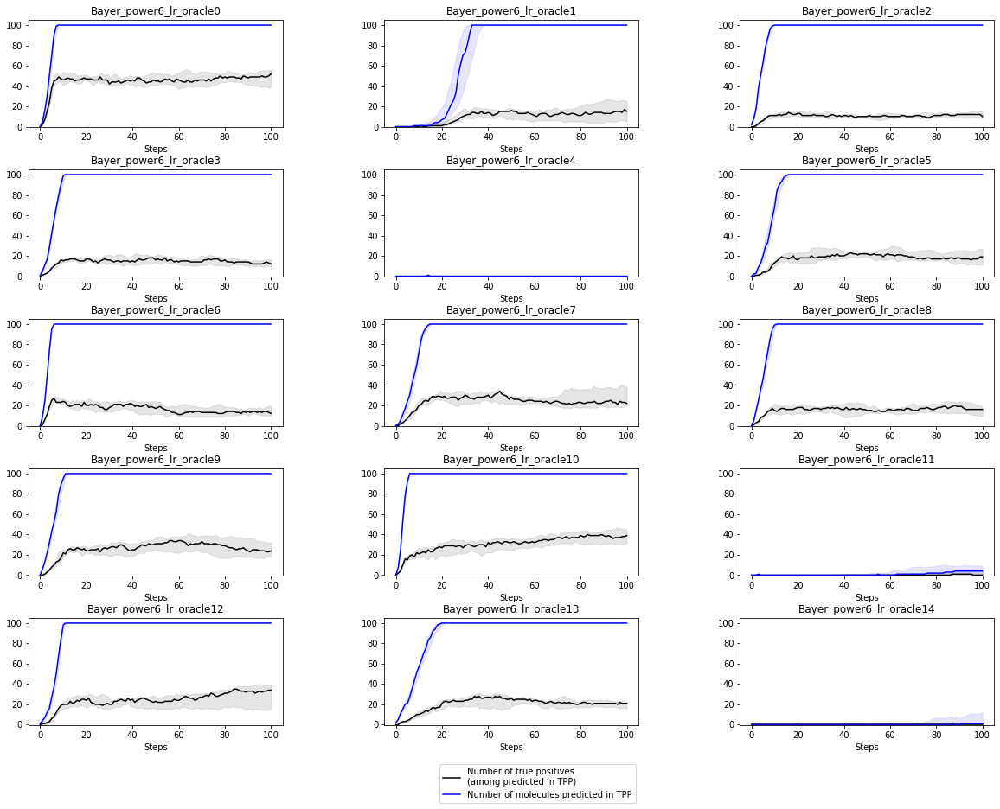

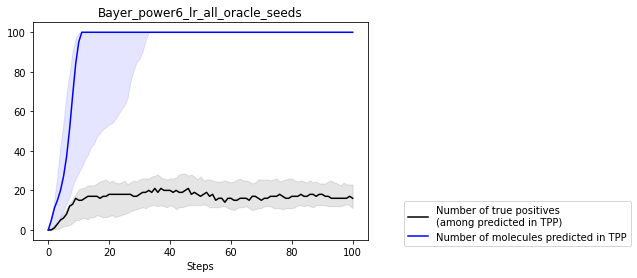

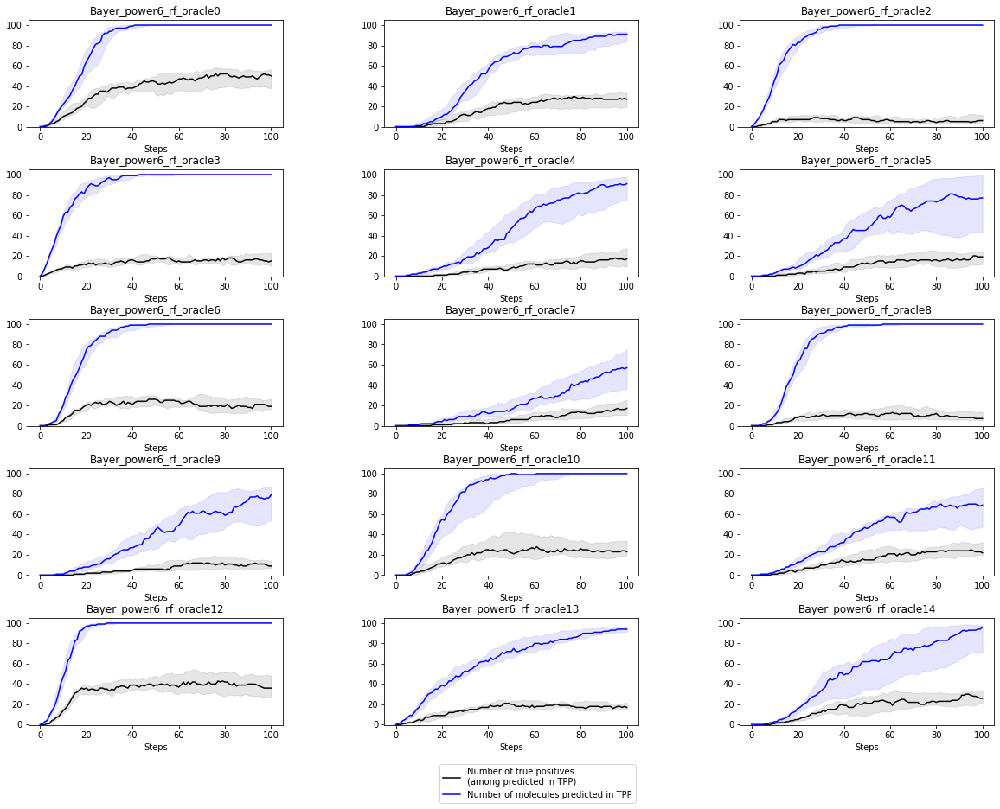

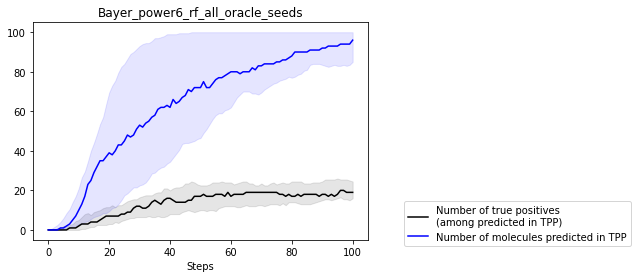

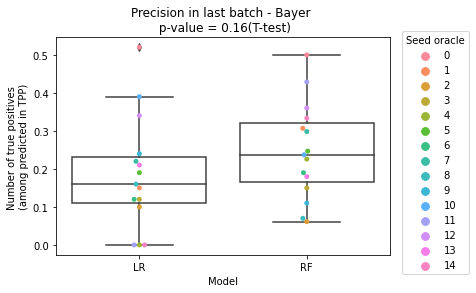

...

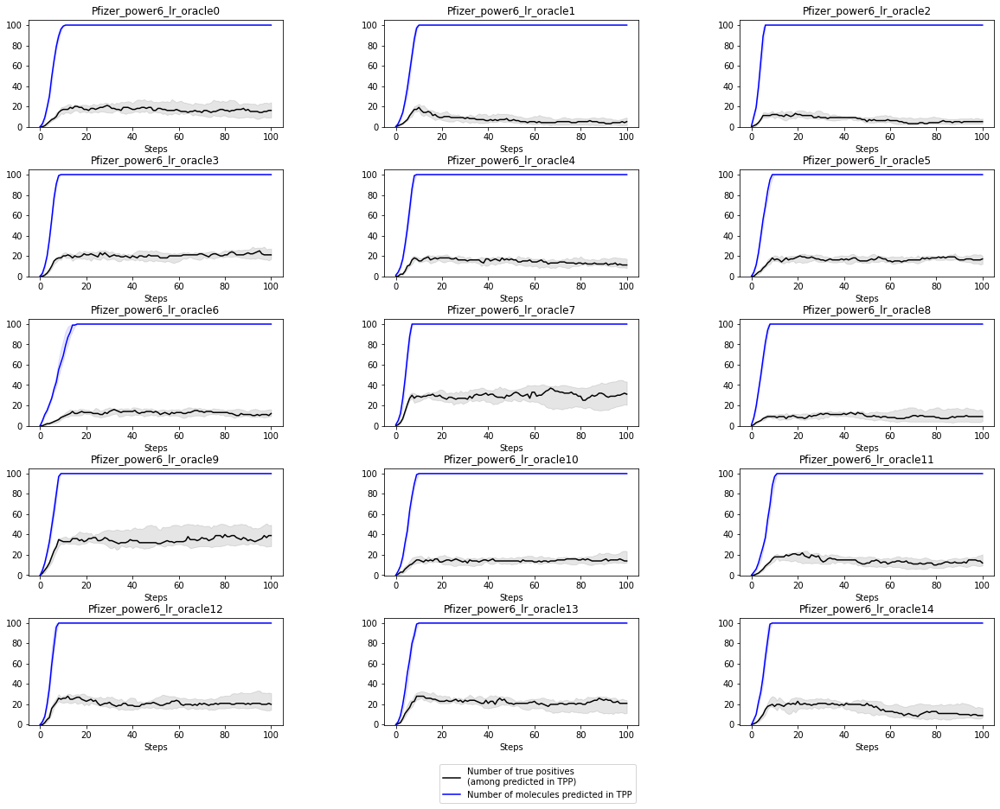

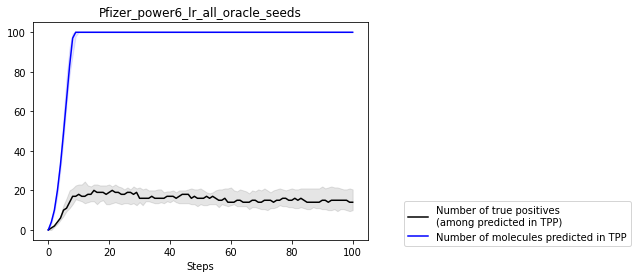

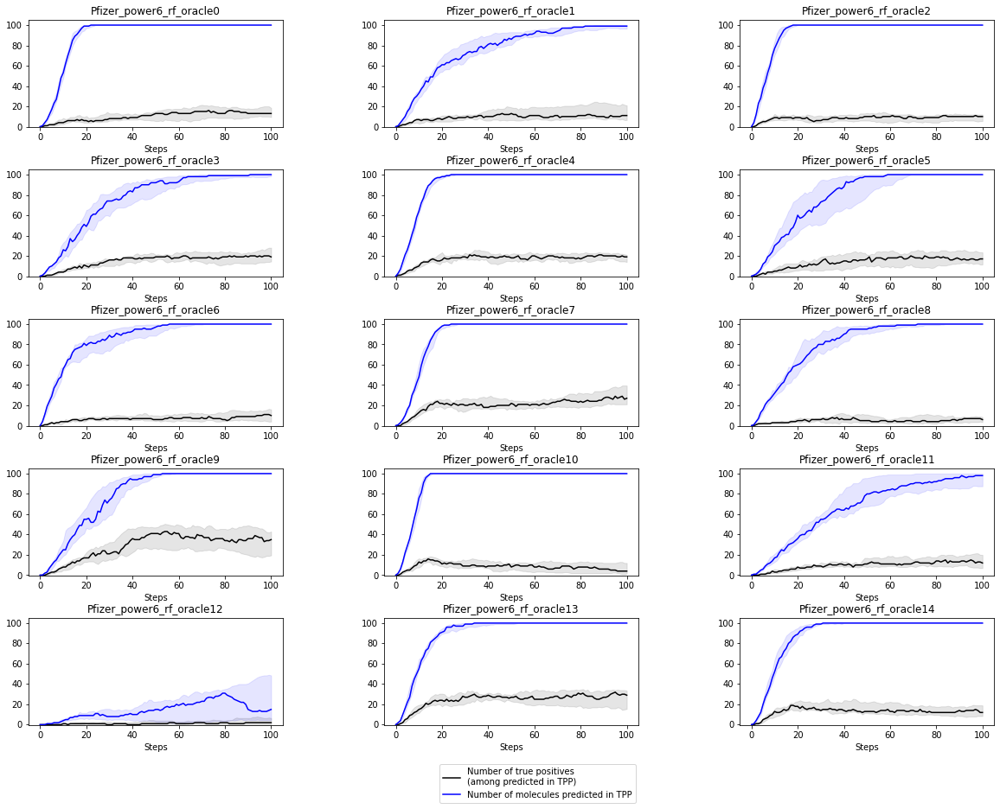

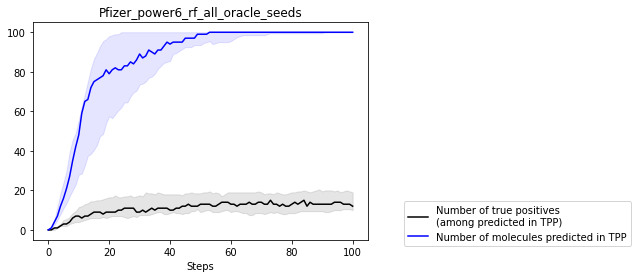

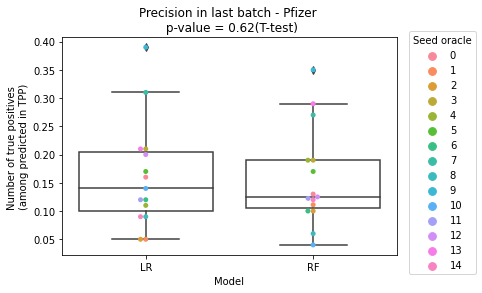

In [37]:
# ANalysis of number of predicted actives, and precision (among predicted actives)
dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

L_df_res, K = [],0

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(0,num_seeds_oracle):
            target0 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            target1 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid1'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0+'_SEP_'+target1,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)
            L_precision = []
            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))
                    

                    
                    
                    L_real = []
                    L_model_for_optim = []
                    for idx in range(nb_steps+1):
                        real_solutions = np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])\
                            *np.array(results_one['oracle_binned_'+target1][idx]['oracle_binned_'+target1])
                        predicted_solutions = (np.array(results_one['model_for_optim'][idx][target0])>=0.5)\
                            *(np.array(results_one['model_for_optim'][idx][target1])>=0.5)
                        L_real.append(np.sum(real_solutions*predicted_solutions))
                        L_model_for_optim.append(np.sum(predicted_solutions))
                    dico_results[seed_ga] = L_real
                    dico_model_for_optim[seed_ga]=L_model_for_optim
                    
                    if np.sum(predicted_solutions)==0:
                        precision_among_predicted = 0
                    else:
                        precision_among_predicted = np.sum(real_solutions*predicted_solutions)/np.sum(predicted_solutions)
                    L_precision.append(precision_among_predicted)


            
            df_all = pd.DataFrame(dico_results)
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)


            ax = fig.add_subplot(5, 3, seed_oracle+1)
            yticks = np.arange(0., 100+0.01, 20)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=-0.1,top=105)
            med_all = median_score_single(df_all,label='Number of true positives \n(among predicted in TPP)',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Number of molecules predicted in TPP',color='blue')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)

            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(np.median(L_precision))
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(np.median(L_precision))
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots_biobj/grid_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)

        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T

        median_score_single(df_all,label='Number of true positives \n(among predicted in TPP)',color='black')
        median_score_single(df_model_for_optim,label='Number of molecules predicted in TPP',color='blue')

        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.8,0.2])
        plt.savefig('saved_plots_biobj/average_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        

        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Number of true positives \n(among predicted in TPP)'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    
    
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    
    if np.log10(p_value)<=-2:
        plt.title('Precision in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Precision in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()
    
    df_res['oracle']+=15*K
    L_df_res.append(df_res)
    K+=1

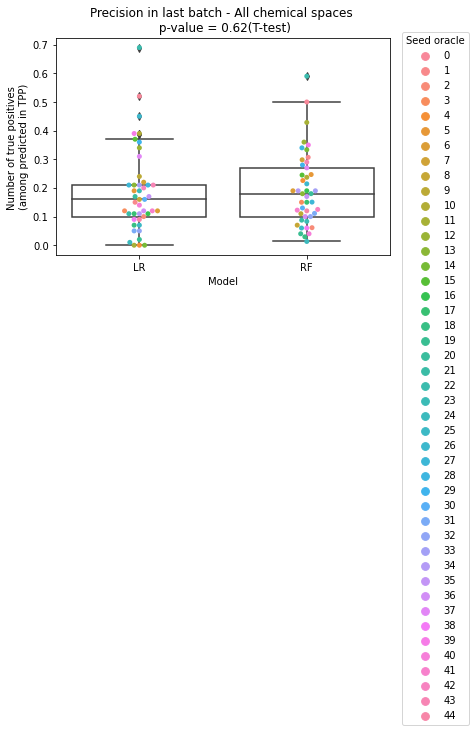

In [38]:
df_res = pd.concat(L_df_res).reset_index(drop=True)
ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')


p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]

if np.log10(p_value)<=-2:
    plt.title('Precision in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Precision in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

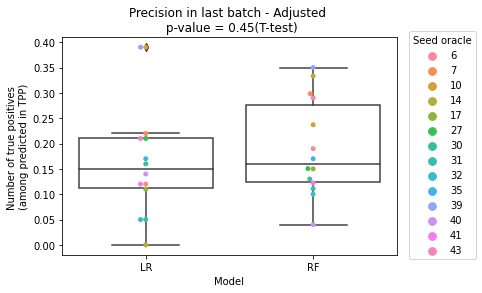

In [39]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Number of true positives \n(among predicted in TPP)'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Number of true positives \n(among predicted in TPP)'])[1]
if np.log10(p_value)<=-2:
    plt.title('Precision in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Precision in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

# Biobjective power 15

In [40]:
# biobjective, power 15
power = 15
nb_steps = 100
directory_results = 'my_res_dir'
num_targets=2
num_seeds_oracle = 15

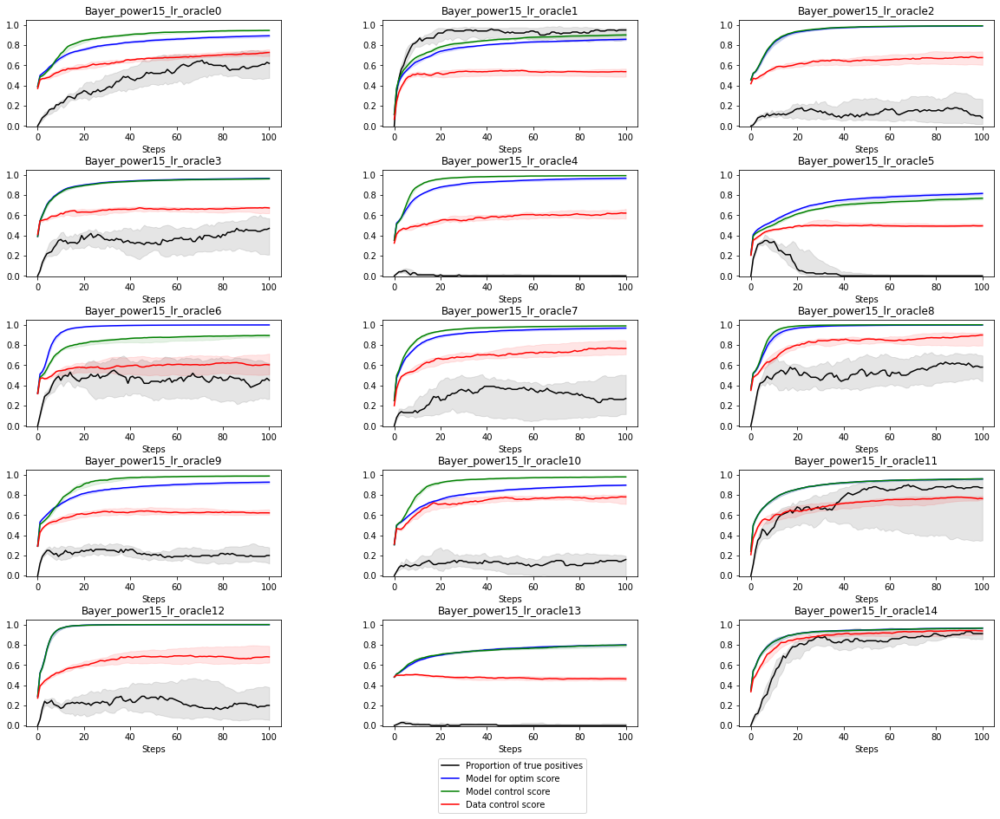

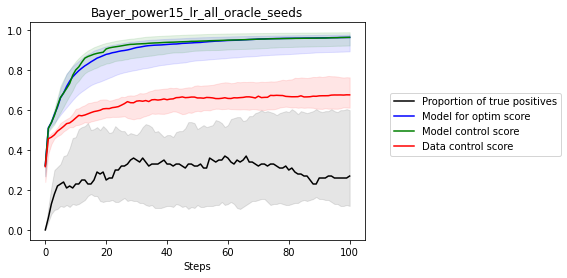

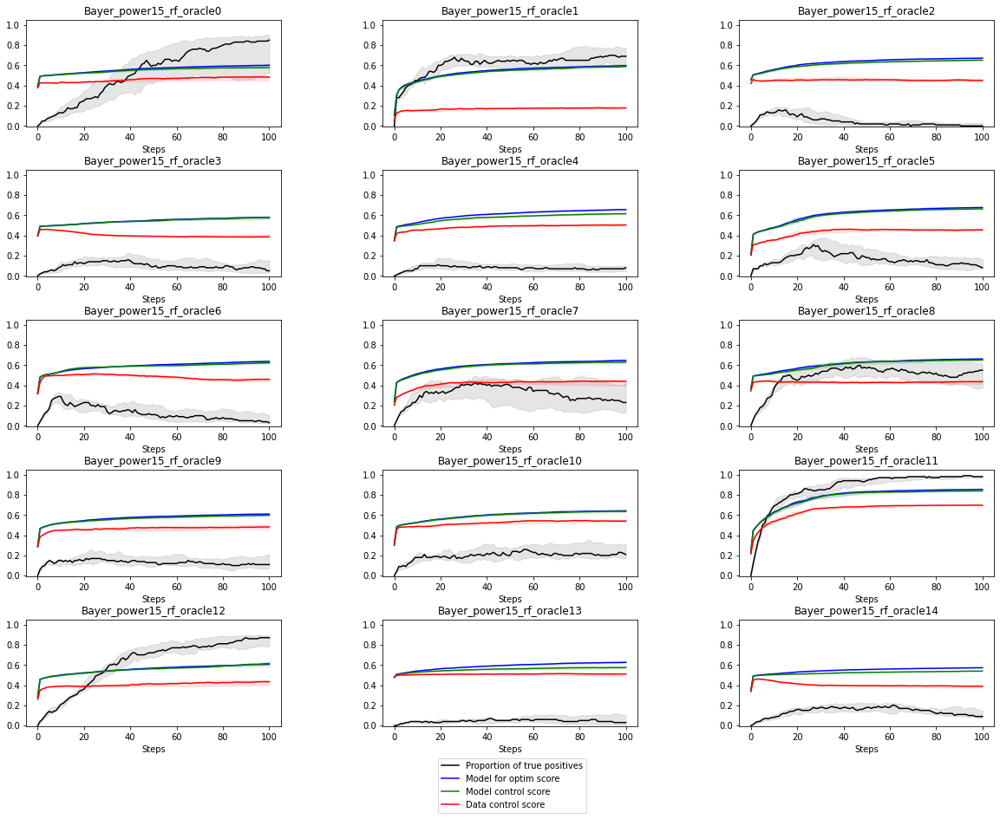

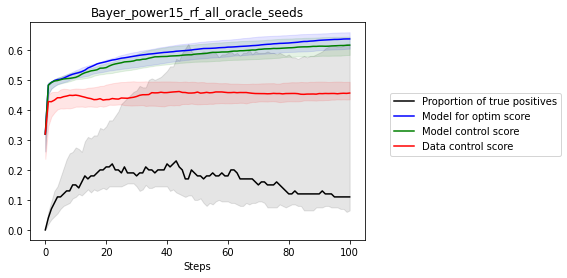

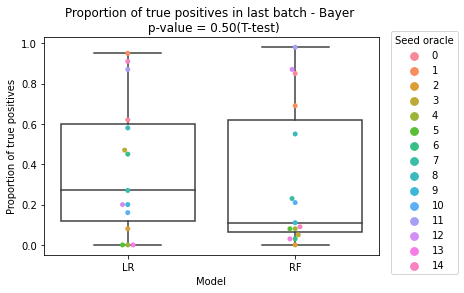

...

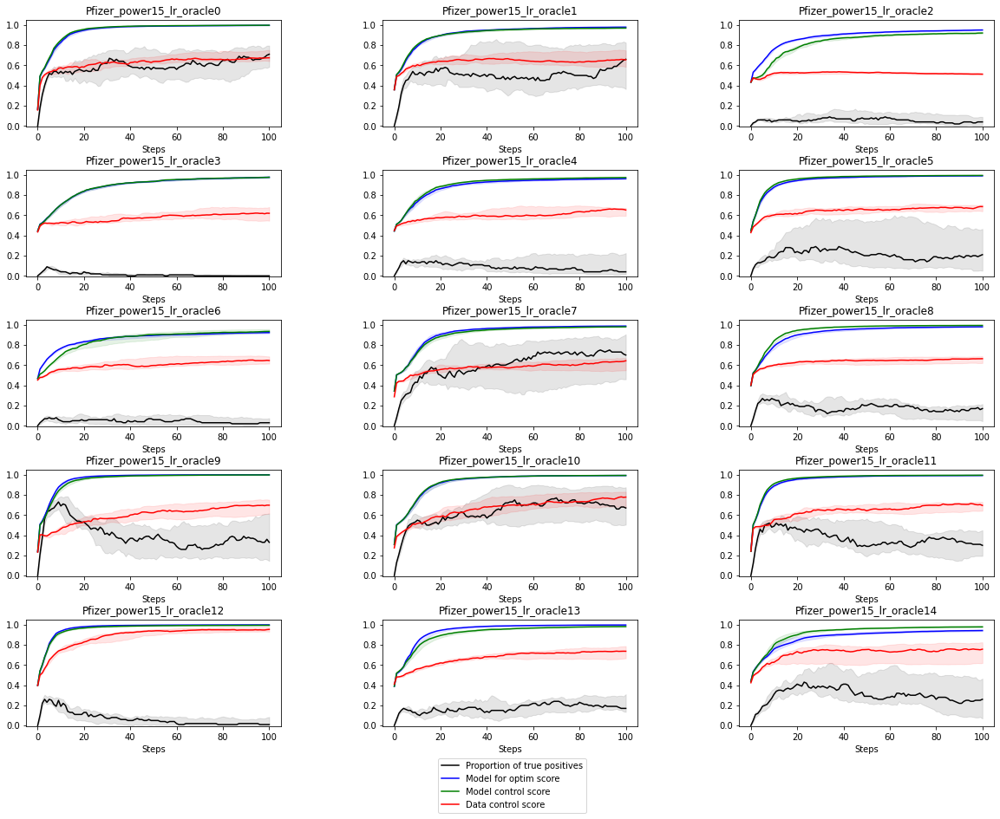

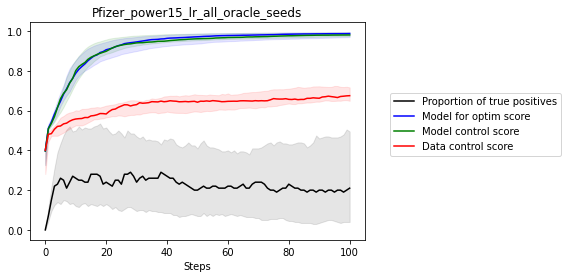

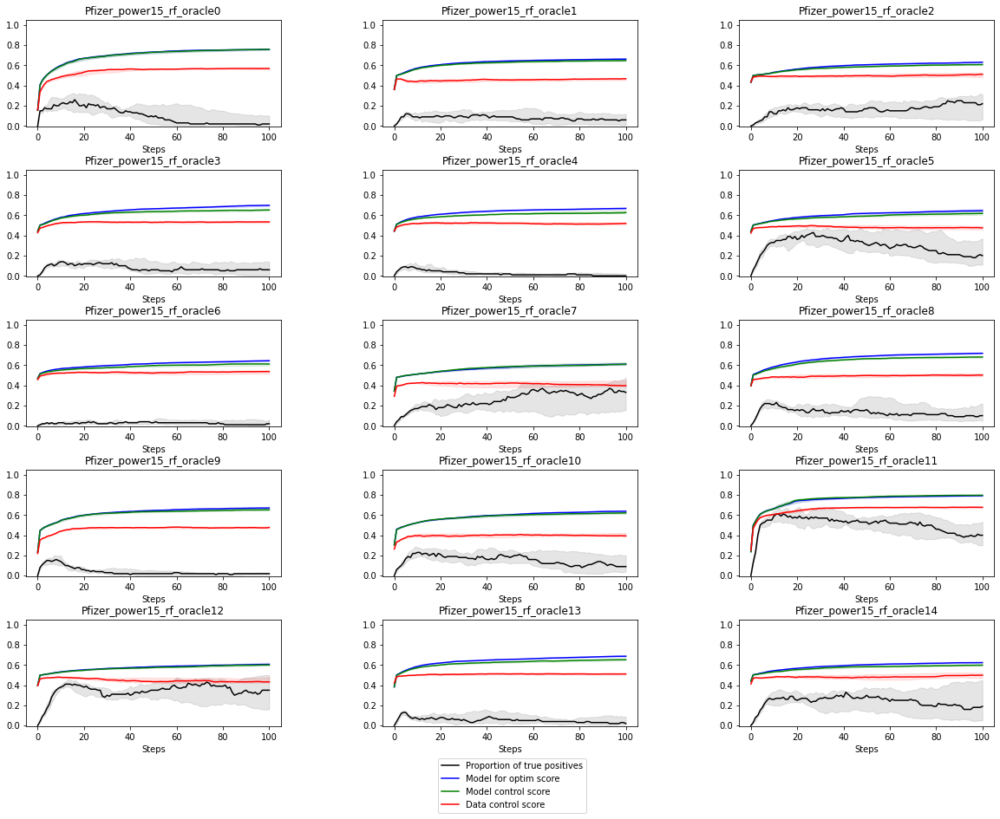

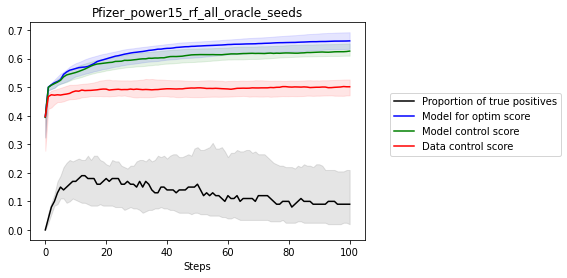

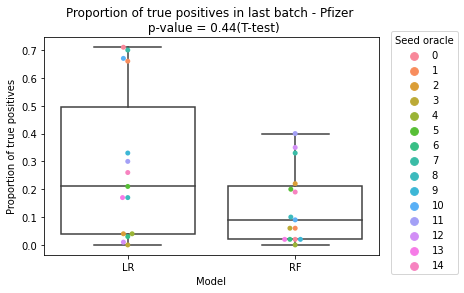

In [41]:
dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_med_model_control = dict()
dico_med_data_control = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_med_model_control['rf'],dico_med_model_control['lr']=[],[]
dico_med_data_control['rf'],dico_med_data_control['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(0,num_seeds_oracle):
            target0 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            target1 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid1'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0+'_SEP_'+target1,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)

            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))
                    
                    L_real = []
                    for idx in range(nb_steps+1):
                        L_real.append(np.mean(np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])\
                                              *np.array(results_one['oracle_binned_'+target1][idx]['oracle_binned_'+target1])))
                    dico_results[seed_ga] = L_real
                    
                    L_model_for_optim = []
                    for idx in range(nb_steps+1):
                        L_model_for_optim.append(np.mean(0.5*np.array(results_one['model_for_optim'][idx][target0])+\
                                                        0.5*np.array(results_one['model_for_optim'][idx][target1])))
                    dico_model_for_optim[seed_ga]=L_model_for_optim

                    L_model_control = []
                    for idx in range(nb_steps+1):
                        L_model_control.append(np.mean(0.5*np.array(results_one['model_control'][idx][target0])+\
                                                        0.5*np.array(results_one['model_control'][idx][target1])))
                    dico_model_control[seed_ga]=L_model_control

                    L_data_control = []
                    for idx in range(nb_steps+1):
                        L_data_control.append(np.mean(0.5*np.array(results_one['data_control'][idx][target0])+\
                                                     0.5*np.array(results_one['data_control'][idx][target1])))
                    dico_data_control[seed_ga]=L_data_control

            df_all = pd.DataFrame(dico_results)
            dico_med_all[model_type]
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)
            df_model_control = pd.DataFrame(dico_model_control)
            df_data_control = pd.DataFrame(dico_data_control)

            ax = fig.add_subplot(5, 3, seed_oracle+1)
            yticks = np.arange(0., 1+0.01, 0.2)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=-0.01,top=1.05)
            med_all = median_score_single(df_all,label='Proportion of true positives',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
            med_model_control = median_score_single(df_model_control,label='Model control score',color='green')
            med_data_control = median_score_single(df_data_control,label='Data control score',color='red')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)
            l_med_model_control.append(med_model_control)
            l_med_data_control.append(med_data_control)
            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(median_real.iloc[-1])
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(median_real.iloc[-1])
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots_biobj/grid_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)
        dico_med_model_control[model_type].extend(l_med_model_control)
        dico_med_data_control[model_type].extend(l_med_data_control)
        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T
        df_model_control = pd.DataFrame(l_med_model_control).T
        df_data_control = pd.DataFrame(l_med_data_control).T
        median_score_single(df_all,label='Proportion of true positives',color='black')
        median_score_single(df_model_for_optim,label='Model for optim score',color='blue')
        median_score_single(df_model_control,label='Model control score',color='green')
        median_score_single(df_data_control,label='Data control score',color='red')
        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.6,0.7])
        plt.savefig('saved_plots_biobj/average_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Proportion of true positives'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    
    
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    if np.log10(p_value)<=-2:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Proportion of true positives in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()

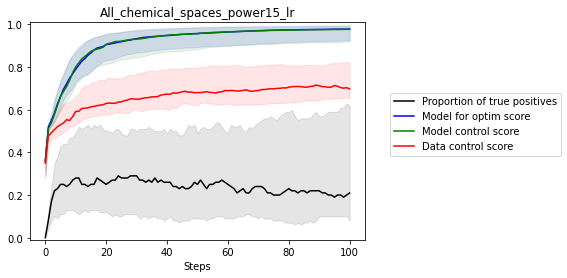

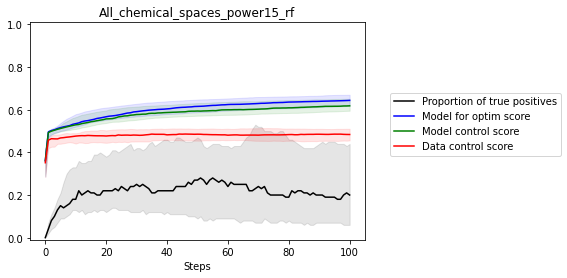

In [42]:
for model_type in ['lr','rf']:
    df_all = pd.DataFrame(dico_med_all[model_type]).T
    df_med_model_control = pd.DataFrame(dico_med_model_control[model_type]).T
    df_med_data_control = pd.DataFrame(dico_med_data_control[model_type]).T
    df_med_model_for_optim = pd.DataFrame(dico_med_model_for_optim[model_type]).T
    median_score_single(df_all,label='Proportion of true positives',color='black')
    median_score_single(df_med_model_for_optim,label='Model for optim score',color='blue')
    median_score_single(df_med_model_control,label='Model control score',color='green')
    median_score_single(df_med_data_control,label='Data control score',color='red')
    plt.xlabel('Steps')
    plt.title('All_chemical_spaces_power'+str(power)+'_'+model_type)
    plt.legend(bbox_to_anchor=[1.6,0.7])
    plt.ylim(-0.01,1.01)
    plt.savefig('saved_plots_biobj/average_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
    plt.show()

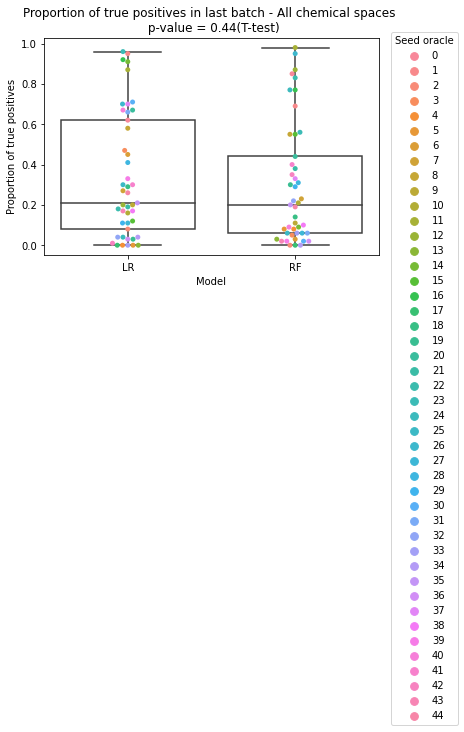

In [43]:
res_df = pd.DataFrame(dico_last_batch['lr']+dico_last_batch['rf'],columns=['Proportion of true positives'])
models_df = pd.DataFrame(['LR' for k in range(45)]+['RF' for k in range(45)],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_res = pd.concat([res_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

In [44]:
auc_dict = dict()
for chemical_space in ['bayer','merck','pfizer']:
    auc_dict[chemical_space] = dict()
    for model_type in ['lr','rf']:
        auc_dict[chemical_space][model_type] = []
        for seed_oracle in range(15):
            metrics = json.load(open(f'MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{seed_oracle}_targid0/{model_type}/model_for_optim_metrics.json', 'r'))
            auc1 = metrics['auc']
            metrics = json.load(open(f'MODELS_DO_NOT_MODIFY/irak4_{chemical_space}/target_{str(num_targets)}targs_power{str(power)}_seed{seed_oracle}_targid1/{model_type}/model_for_optim_metrics.json', 'r'))
            auc2 = metrics['auc']
            auc_dict[chemical_space][model_type].append(0.5*auc1+0.5*auc2)

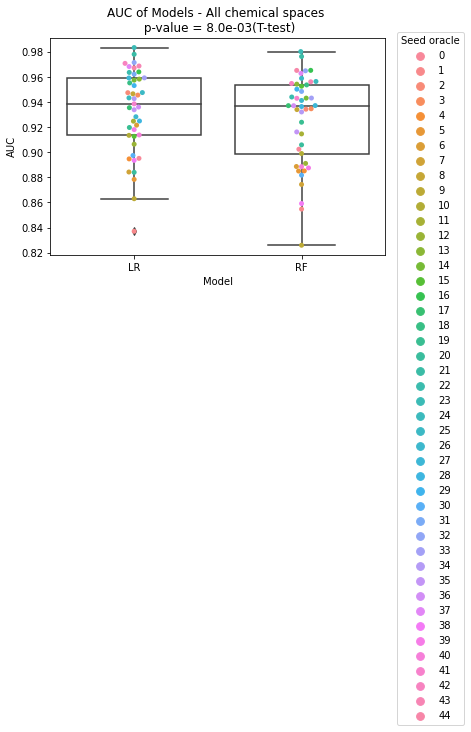

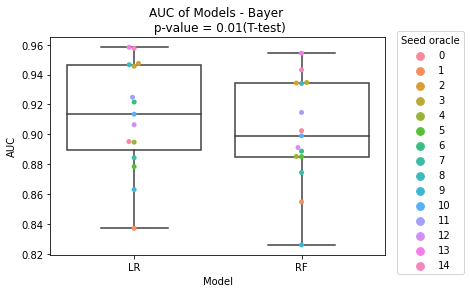

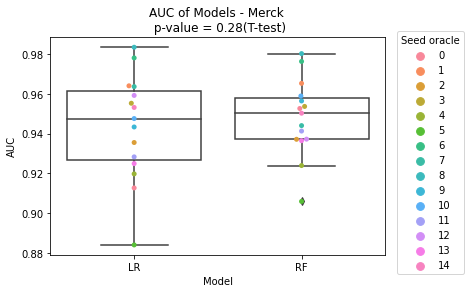

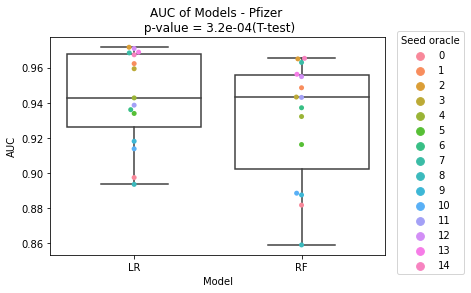

In [45]:
df_auc = plot_aucs(['bayer','merck','pfizer'],'All chemical spaces',return_df=True,dir_save='saved_plots_biobj')
plot_aucs(['bayer'],'Bayer',dir_save='saved_plots_biobj')
plot_aucs(['merck'],'Merck',dir_save='saved_plots_biobj')
plot_aucs(['pfizer'],'Pfizer',dir_save='saved_plots_biobj')

In [46]:
oracles_adjusted = df_auc[df_auc['Model']=='LR'][
    (df_auc[df_auc['Model']=='LR']['AUC']-df_auc[df_auc['Model']=='RF']['AUC'].reset_index(drop=True)<0.015)]
len(oracles_adjusted)

33

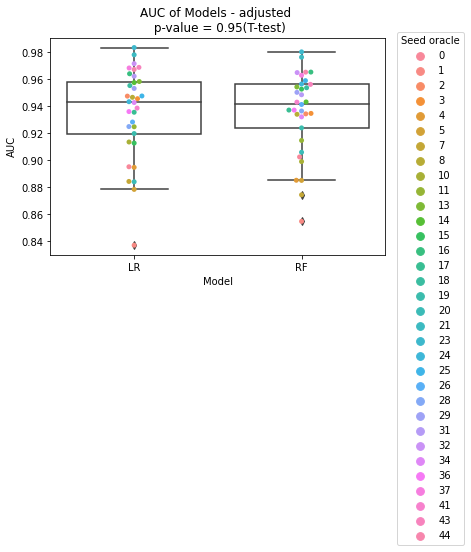

In [47]:
df_auc_adjusted = df_auc[df_auc['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

list_all_aucs = []
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['lr'])
for chemical_space in ['bayer','merck','pfizer']:
    list_all_aucs.extend(auc_dict[chemical_space]['rf'])

auc_df = pd.DataFrame(list_all_aucs,columns=['AUC'])
models_df = pd.DataFrame(['LR' for k in list(range(45))]+
                         ['RF' for k in list(range(45))],columns=['Model'])
oracles_df = pd.DataFrame(list(range(45))+list(range(45)),columns=['oracle'])
df_auc = pd.concat([auc_df,models_df,oracles_df],1)

ax = sb.swarmplot(x="Model", y="AUC", data=df_auc_adjusted, hue="oracle")
sb.boxplot(x="Model", y="AUC", data=df_auc_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='LR'],df_auc_adjusted['AUC'][df_auc_adjusted['Model']=='RF'])[1]
if np.log10(p_value)<=-2:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.1e'  % 
               p_value+'(T-test)')
else:
    plt.title('AUC of Models - '+'adjusted'+' \n p-value = %.2f'  % 
           p_value+'(T-test)')

plt.savefig('saved_plots_biobj/boxplot_auc_'+model_type+'_'+'adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

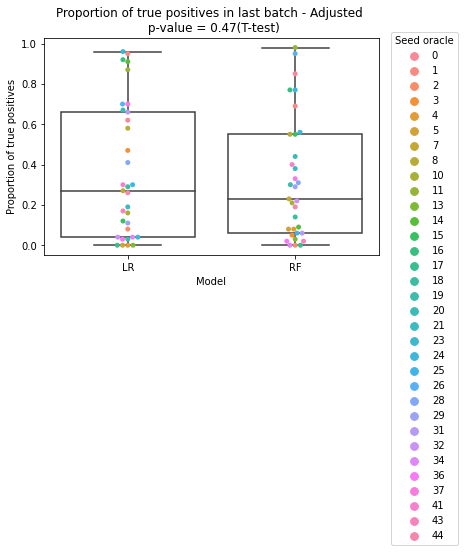

In [48]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

ax = sb.swarmplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Proportion of true positives", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Proportion of true positives'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Proportion of true positives'])[1]
if np.log10(p_value)<=-2:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Proportion of true positives in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

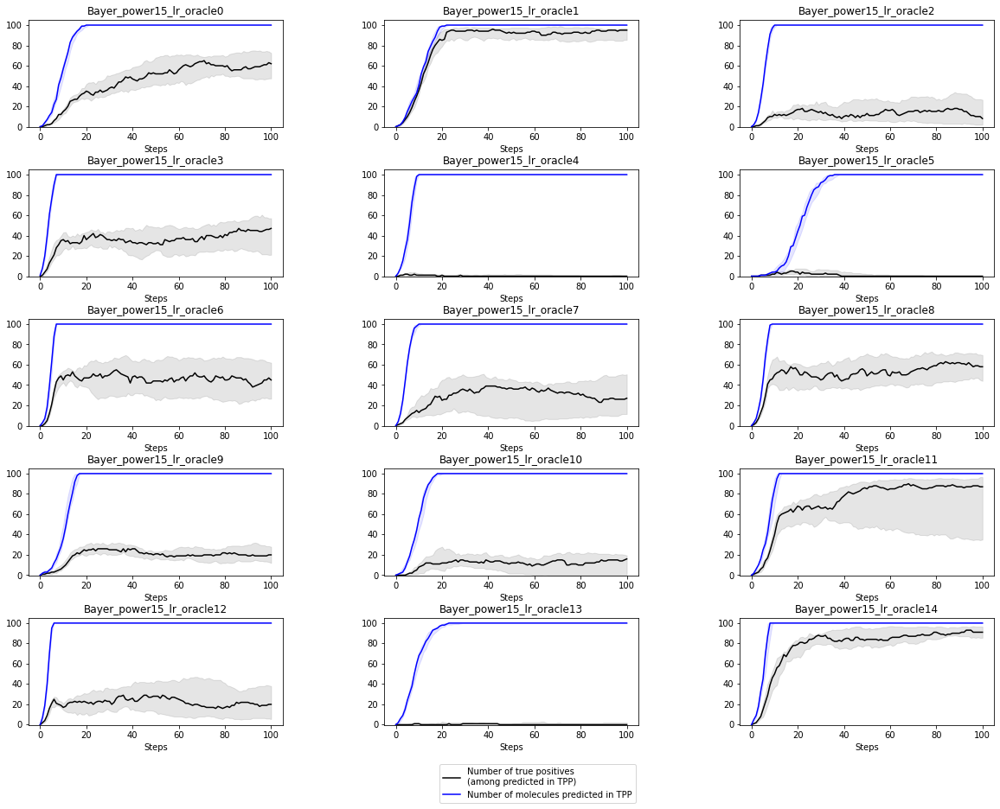

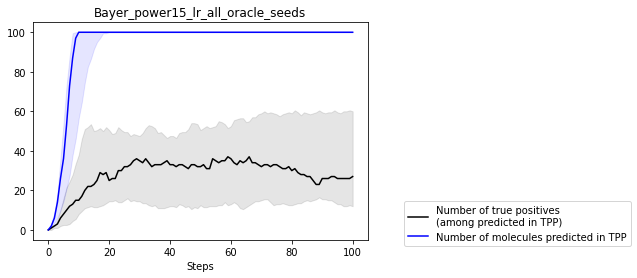

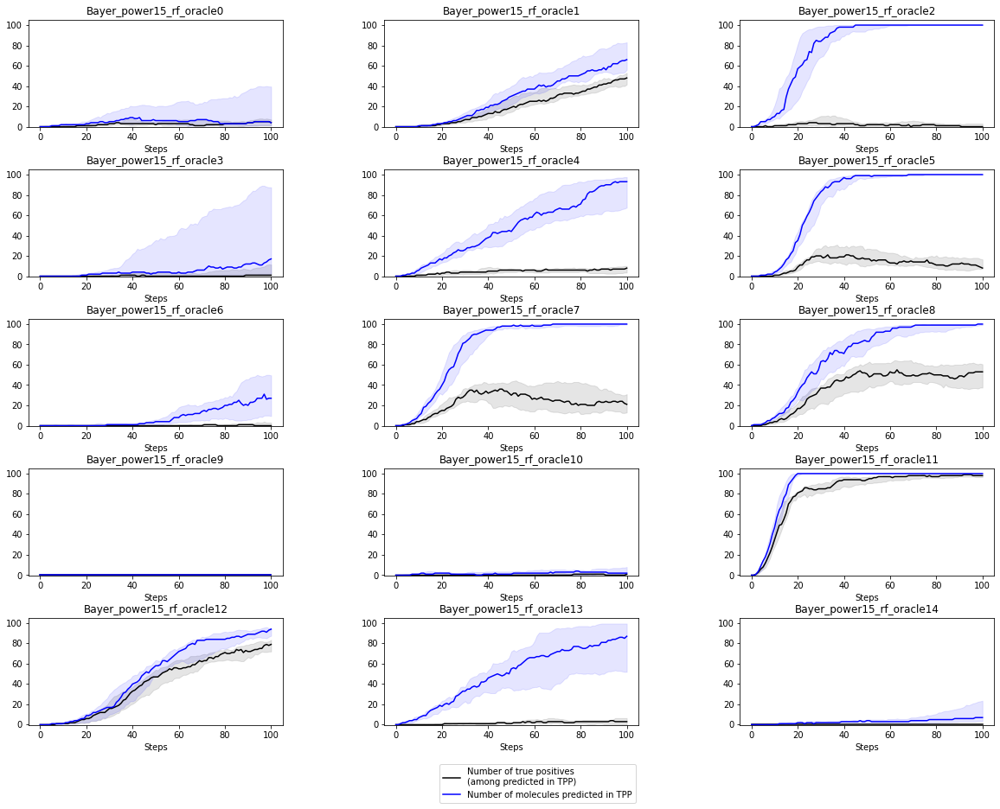

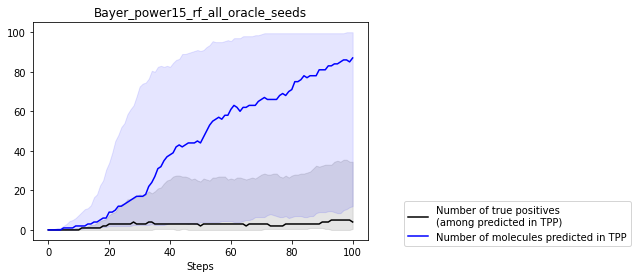

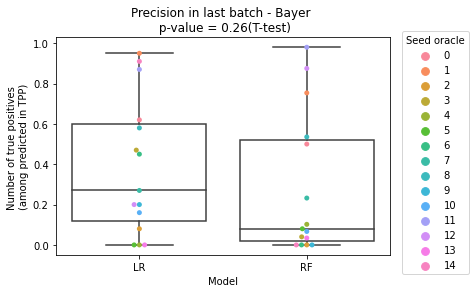

...

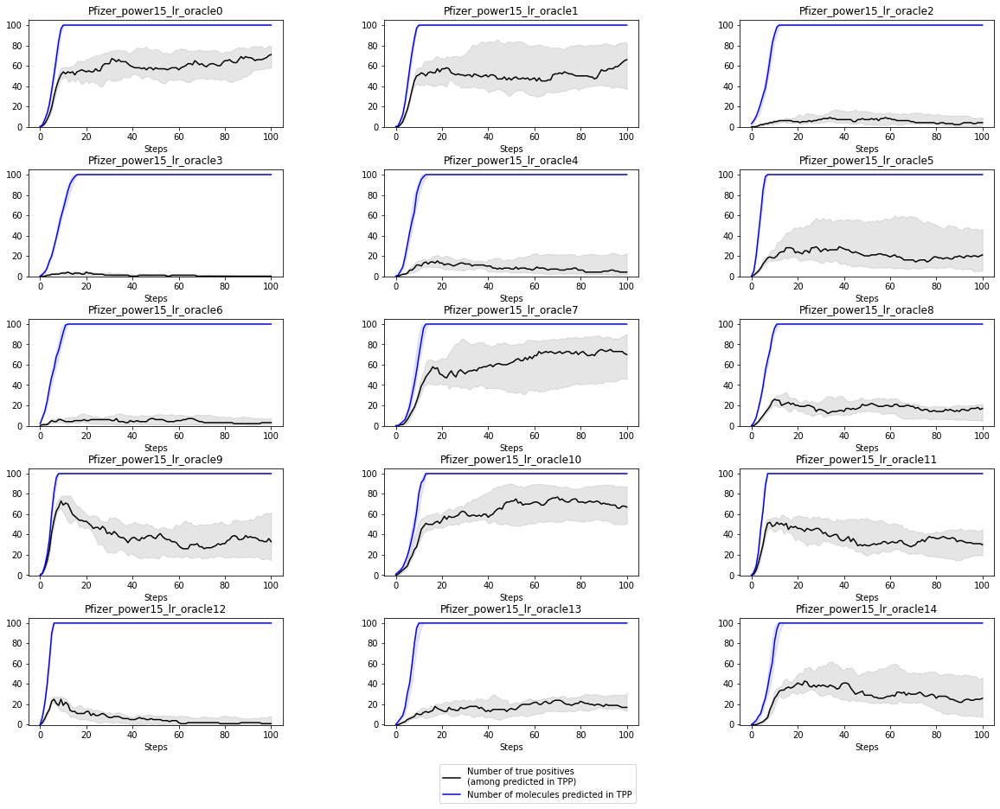

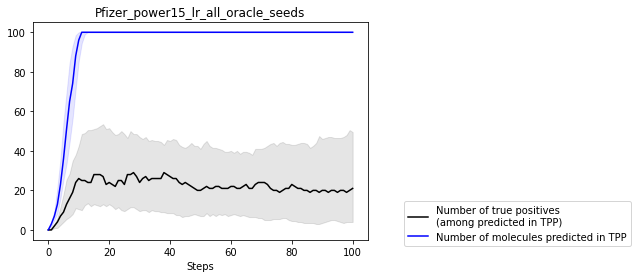

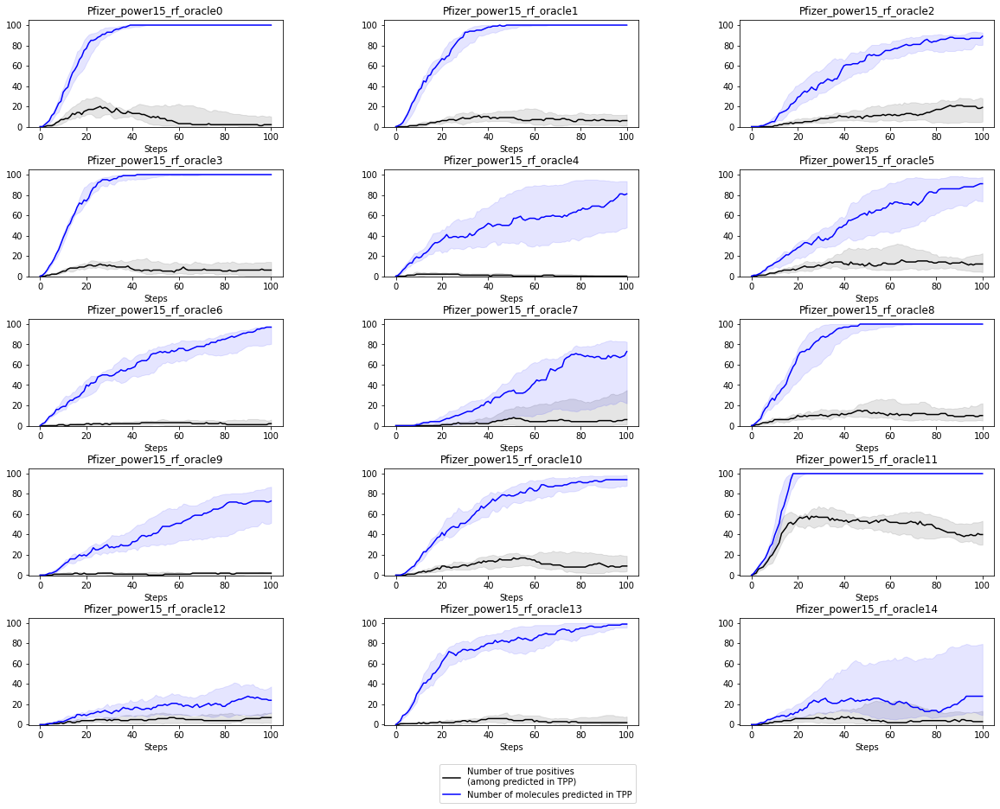

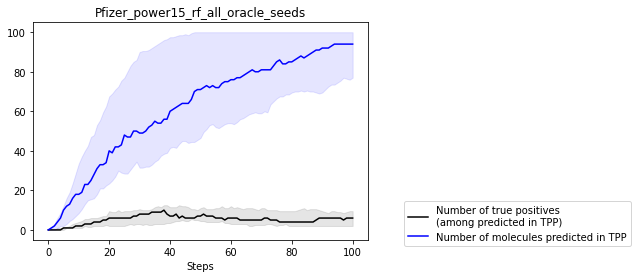

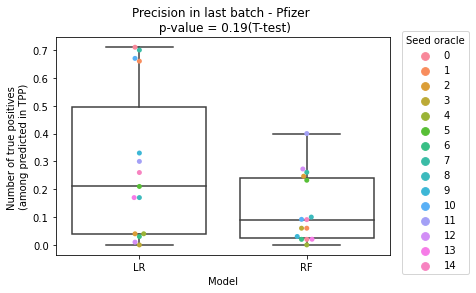

In [49]:
# ANalysis of number of predicted actives, and precision (among predicted actives)
dico_med_all = dict()
dico_med_model_for_optim = dict()
dico_last_batch = dict()

dico_med_all['rf'],dico_med_all['lr']=[],[]
dico_med_model_for_optim['rf'],dico_med_model_for_optim['lr']=[],[]
dico_last_batch['rf'],dico_last_batch['lr']=[],[]

L_df_res, K = [],0

for chemical_space in ['bayer','merck','pfizer']:
    chemical_space_name = chemical_space
    chemical_space_name=chemical_space_name[0].upper()+chemical_space_name[1:]
    last_rf = []
    last_lr = []
    for model_type in ['lr','rf']:
        fig = plt.figure(figsize=(20,15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        dataset = 'irak4_'+chemical_space+'_cs'
        l_med_all = []
        l_med_model_for_optim = []
        l_med_model_control = []
        l_med_data_control = []
        for seed_oracle in range(0,num_seeds_oracle):
            target0 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid0'
            target1 = 'target_2targs_power'+str(power)+'_seed'+str(seed_oracle)+'_targid1'
            algorithm = 'graph_ga'

            path_res = os.path.join(directory_results,dataset,target0+'_SEP_'+target1,model_type,algorithm)
            dico_results = dict()
            dico_model_for_optim = dict()
            dico_model_control = dict()
            dico_data_control = dict()

            list_dir = os.listdir(path_res)
            L_precision = []
            for seed_ga,folder in enumerate(list_dir):
                if folder !='.ipynb_checkpoints':
                    results_one = json.load(open(path_res+'/'+folder+'/'+'results.json', 'r'))
                    

                    
                    
                    L_real = []
                    L_model_for_optim = []
                    for idx in range(nb_steps+1):
                        real_solutions = np.array(results_one['oracle_binned_'+target0][idx]['oracle_binned_'+target0])\
                            *np.array(results_one['oracle_binned_'+target1][idx]['oracle_binned_'+target1])
                        predicted_solutions = (np.array(results_one['model_for_optim'][idx][target0])>=0.5)\
                            *(np.array(results_one['model_for_optim'][idx][target1])>=0.5)
                        L_real.append(np.sum(real_solutions*predicted_solutions))
                        L_model_for_optim.append(np.sum(predicted_solutions))
                    dico_results[seed_ga] = L_real
                    dico_model_for_optim[seed_ga]=L_model_for_optim
                    
                    if np.sum(predicted_solutions)==0:
                        precision_among_predicted = 0
                    else:
                        precision_among_predicted = np.sum(real_solutions*predicted_solutions)/np.sum(predicted_solutions)
                    L_precision.append(precision_among_predicted)


            
            df_all = pd.DataFrame(dico_results)
            median_real = df_all.median(1)
            df_model_for_optim = pd.DataFrame(dico_model_for_optim)


            ax = fig.add_subplot(5, 3, seed_oracle+1)
            yticks = np.arange(0., 100+0.01, 20)
            ax.set_yticks(yticks)
            plt.gca().set_ylim(bottom=-0.1,top=105)
            med_all = median_score_single(df_all,label='Number of true positives \n(among predicted in TPP)',color='black')
            med_model_for_optim = median_score_single(df_model_for_optim,label='Number of molecules predicted in TPP',color='blue')
            plt.xlabel('Steps')
            plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_oracle'+str(seed_oracle))
            l_med_all.append(med_all)
            l_med_model_for_optim.append(med_model_for_optim)

            if seed_oracle==num_seeds_oracle-2:
                plt.legend(loc='center left', bbox_to_anchor=(0.2, -0.55))
            if model_type == 'rf':
                last_rf.append(np.median(L_precision))
                dico_last_batch['rf'].append(last_rf[-1])
            if model_type == 'lr':
                last_lr.append(np.median(L_precision))
                dico_last_batch['lr'].append(last_lr[-1])
        plt.savefig('saved_plots_biobj/grid_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
        plt.show()
        
        dico_med_all[model_type].extend(l_med_all)
        dico_med_model_for_optim[model_type].extend(l_med_model_for_optim)

        
        df_all = pd.DataFrame(l_med_all).T
        df_model_for_optim = pd.DataFrame(l_med_model_for_optim).T

        median_score_single(df_all,label='Number of true positives \n(among predicted in TPP)',color='black')
        median_score_single(df_model_for_optim,label='Number of molecules predicted in TPP',color='blue')

        plt.xlabel('Steps')
        plt.title(chemical_space_name+'_power'+str(power)+'_'+model_type+'_all_oracle_seeds')
        plt.legend(bbox_to_anchor=[1.8,0.2])
        plt.savefig('saved_plots_biobj/average_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True, bbox_inches="tight")
        plt.show()
        

        
        res_df = pd.DataFrame(last_lr+last_rf,columns=['Number of true positives \n(among predicted in TPP)'])
        models_df = pd.DataFrame(['LR' for k in range(15)]+['RF' for k in range(15)],columns=['Model'])
        oracles_df = pd.DataFrame(list(range(15))+list(range(15)),columns=['oracle'])
        df_res = pd.concat([res_df,models_df,oracles_df],1)

    ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, hue="oracle")
    sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, boxprops={'facecolor':'None'})
    plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
    
    
    p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]
    
    if np.log10(p_value)<=-2:
        plt.title('Precision in last batch - '+chemical_space_name+' \n p-value = %.1e' % 
                   p_value+'(T-test)')
    else:
        plt.title('Precision in last batch - '+chemical_space_name+' \n p-value = %.2f' % 
           p_value+'(T-test)')
    plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+chemical_space+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
    plt.show()
    
    df_res['oracle']+=15*K
    L_df_res.append(df_res)
    K+=1

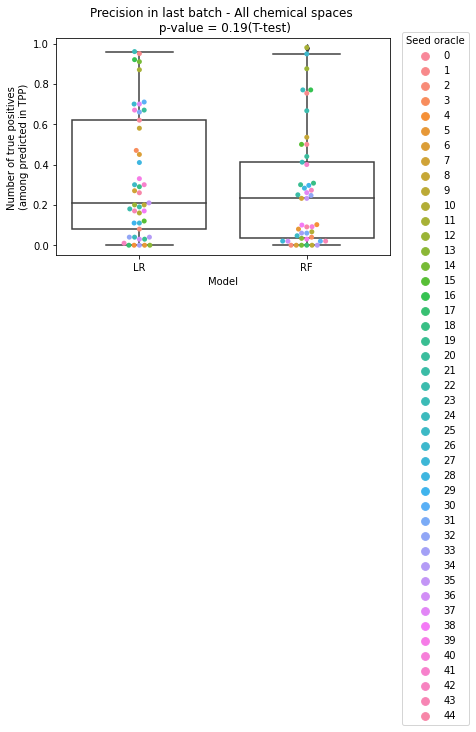

In [50]:
df_res = pd.concat(L_df_res).reset_index(drop=True)
ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, hue="oracle")
sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')


p_value = ttest_rel(dico_last_batch['lr'],dico_last_batch['rf'])[1]

if np.log10(p_value)<=-2:
    plt.title('Precision in last batch - '+'All chemical spaces'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Precision in last batch - '+'All chemical spaces'+' \n p-value = %.2f' % 
       p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+'all_chemical_spaces'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()

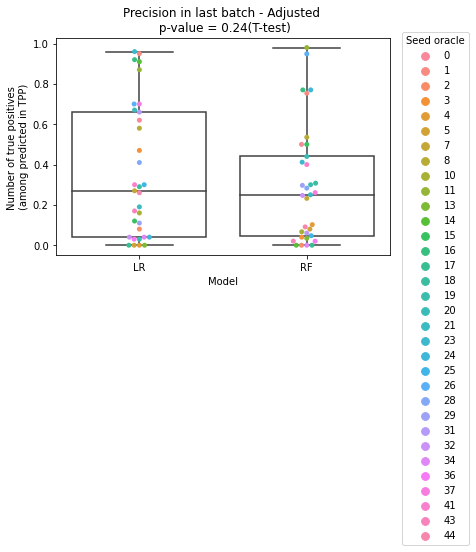

In [51]:
df_res_adjusted = df_res[df_res['oracle'].isin(oracles_adjusted['oracle'])].reset_index(drop=True)

ax = sb.swarmplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res_adjusted, hue="oracle")
sb.boxplot(x="Model", y="Number of true positives \n(among predicted in TPP)", data=df_res_adjusted, boxprops={'facecolor':'None'})
plt.legend(bbox_to_anchor=[1.25,1.05],title='Seed oracle')
p_value = ttest_rel(df_res_adjusted[df_res_adjusted['Model']=='LR']['Number of true positives \n(among predicted in TPP)'],
                    df_res_adjusted[df_res_adjusted['Model']=='RF']['Number of true positives \n(among predicted in TPP)'])[1]
if np.log10(p_value)<=-2:
    plt.title('Precision in last batch - '+'Adjusted'+' \n p-value = %.1e' % 
               p_value+'(T-test)')
else:
    plt.title('Precision in last batch - '+'Adjusted'+' \n p-value = %.2f' % 
           p_value+'(T-test)')
plt.savefig('saved_plots_biobj/boxplot_amongpredicted_'+model_type+'_'+'all_chemical_spaces_adjusted'+'_power'+str(power)+'.jpeg', edgecolor='black', dpi=300, transparent=True)
plt.show()